In [1]:
import numpy as np
#import seaborn as sns
#sns.set()
#sns.set(font_scale=1.)
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from scipy.linalg import lstsq
from scipy.optimize import curve_fit, nnls, minimize
from scipy.signal.windows import blackman
from scipy import fftpack
from scipy import stats
from scipy.signal import find_peaks, hilbert, windows, stft
from scipy.integrate import simps
from scipy.interpolate import UnivariateSpline, InterpolatedUnivariateSpline
from scipy.ndimage import gaussian_filter1d

import glob
import os
from dataclasses import dataclass

import itertools as IT
from itertools import product
from tqdm import tqdm

# from quspin.tools.measurements import project_op
# from tools import HubbardModel as fhmodel, InitializeArchive
import psutil
from multiprocessing import Pool
import pickle
import h5py

In [2]:
# Set the initial plotting parameters

# Colorblind friendly color scheme reordered for maximum efficiency
ok = {
    'blue': "#56B4E9",
    'orange': "#E69F00",
    'green': "#009E73",
    'amber': "#F5C710",
    'purple': "#CC79A7",
    'navy': "#0072B2",
    'red': "#D55E00",
    'black': "#000000",
    'yellow': "#F0E442",
    'grey': "#999999",
}

plt_params = {
        'figure.figsize': (8, 6),
        'figure.dpi': 300,
        'legend.fontsize': 16,
        'axes.labelsize': 16,
        'axes.titlesize': 16,
        'axes.prop_cycle': plt.cycler('color', (ok[_] for _ in ok)),
        'xtick.labelsize': 16,
        'ytick.labelsize': 16,
        'lines.linewidth': 3.5,
        }
plt.rcParams.update(plt_params)


In [3]:
f1 = np.load('./Data/Paper/Fig.1.npz')
f2a = np.load('./Data/Paper/Fig.2(a).npz')
f2b = np.load('./Data/Paper/Fig.2(b).npz')
f3 = np.load('./Data/Paper/Fig.3.npz')
f4a = np.load('./Data/Paper/Fig.4(a).npz')
f4b = np.load('./Data/Paper/Fig.4(b).npz')
f5a = np.load('./Data/Paper/Fig.5(a).npz')
f5b = np.load('./Data/Paper/Fig.5(b).npz')
f5c = np.load('./Data/Paper/Fig.5(c).npz')


## Figure 1

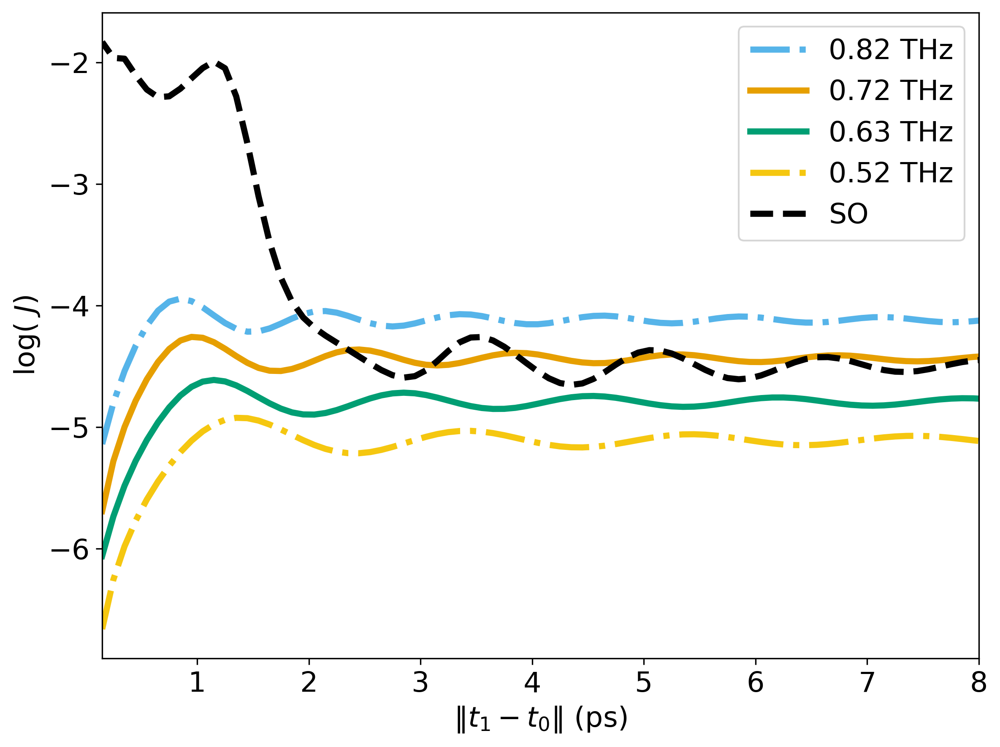

In [4]:

h1 = [_ for _ in f1.keys()]

plt.figure(num=1)
plt.plot(f1[h1[1]].T[0], f1[h1[1]].T[1], label=h1[1], linestyle='-.')
plt.plot(f1[h1[2]].T[0], f1[h1[2]].T[1], label=h1[2])
plt.plot(f1[h1[3]].T[0], f1[h1[3]].T[1], label=h1[3])
plt.plot(f1[h1[4]].T[0], f1[h1[4]].T[1], label=h1[4], linestyle='-.')
plt.plot(f1[h1[0]].T[0], f1[h1[0]].T[1], label=h1[0], linestyle='--', color=ok['black'])
plt.xlim([f1['SO'].T[0][-2],8])
plt.xlabel("$\|t_1 - t_0 \|$ (ps)")
plt.ylabel("log( $J$)")
plt.legend()
plt.tight_layout()
plt.savefig('./Plots/Paper/Fig1(thick).pdf')
plt.show()

## Figure 2

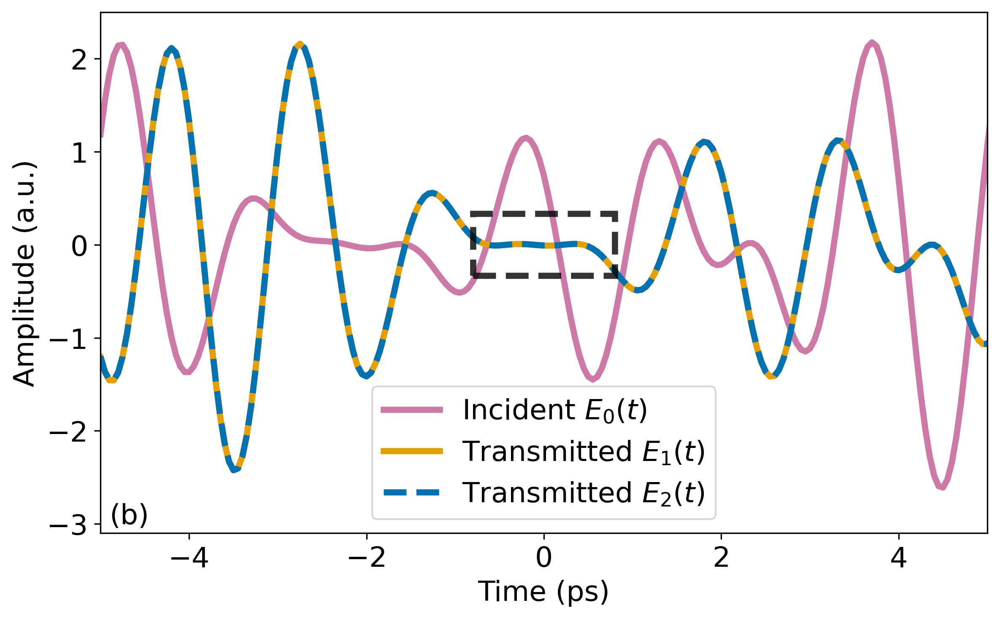

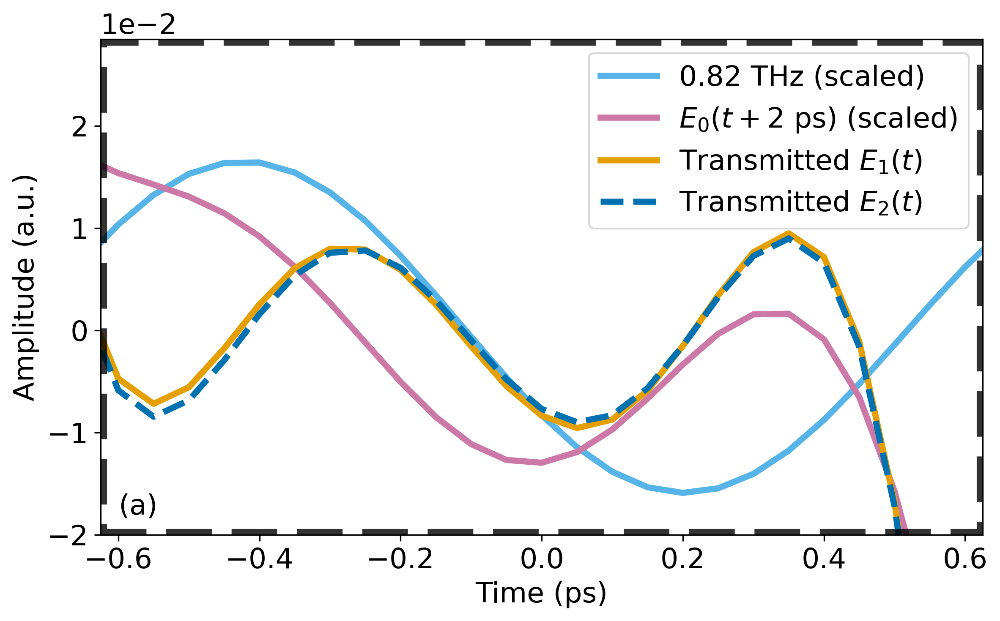

In [5]:
h2a = [_ for _ in f2a.keys()]
h2b = [_ for _ in f2b.keys()]

# Change E_0(t) shifted to E_0(t + 2 ps)

plt.figure(num=2, figsize=(8, 5))
plt.plot(f2a[h2a[0]].T[0], f2a[h2a[0]].T[1], color=ok['purple'], label=h2a[0])
plt.plot(f2a[h2a[1]].T[0], f2a[h2a[1]].T[1], color=ok['orange'], label=h2a[1])
plt.plot(f2a[h2a[2]].T[0], f2a[h2a[2]].T[1], color=ok['navy'], linestyle='--', label=h2a[2])
plt.xlim([-5, 5])
plt.ylim([-3.1, 2.5])
plt.xlabel("Time (ps)")
plt.ylabel("Amplitude (a.u.)")
plt.legend()
plt.subplot().add_patch(
    patches.Rectangle(((0-1.6/2), -0.3333), 1.6, 0.6666, linestyle='--', linewidth=3.5, edgecolor=ok['black'], 
                      facecolor='none', alpha=0.8, zorder=3)
)
plt.subplot().text(-4.9, -3, '(b)', fontsize=16)
plt.tight_layout()
plt.savefig('./Plots/Paper/Fig2(a)(thick).pdf')
plt.show()

plt.figure(num=3, figsize=(8, 5))
plt.plot(f2b[h2b[0]].T[0], (np.array(f2b[h2b[0]].T[1]) * 0.02 / f2b[h2b[0]].T[1].max()),
         color=ok['blue'], label='0.82 THz (scaled)')
plt.plot(f2b[h2b[1]].T[0], (np.array(f2b[h2b[1]].T[1]) * 0.75 / f2b[h2b[1]].T[1].max()),
         color=ok['purple'], label='$E_0 (t + 2$ ps) (scaled)')
plt.plot(f2b[h2b[2]].T[0], f2b[h2b[2]].T[1], color=ok['orange'], label=h2b[2])
plt.plot(f2b[h2b[3]].T[0], f2b[h2b[3]].T[1], color=ok['navy'], linestyle='--', label=h2b[3])
plt.xlim([-0.625, 0.625])
plt.ticklabel_format(style='sci', axis='y', scilimits=(-0.02, 0.02))
plt.ylim([-2e-2, 2.85e-2])
plt.yticks([-.02, -.01, 0, .01, .02])
plt.xlabel("Time (ps)")
plt.ylabel("Amplitude (a.u.)")
plt.legend(loc='upper right')
plt.subplot().add_patch(
    patches.Rectangle(((-0.625), -2e-2), 1.25, 4.85e-2, linestyle='--', linewidth=7, edgecolor=ok['black'], 
                      facecolor='none', alpha=0.8, zorder=3)
)
plt.subplot().text(-0.6, -1.8e-2, '(a)', fontsize=16)
plt.box(True)
plt.tight_layout()
plt.savefig('./Plots/Paper/Fig2b(Frame).pdf')
plt.show()

## Figure 3

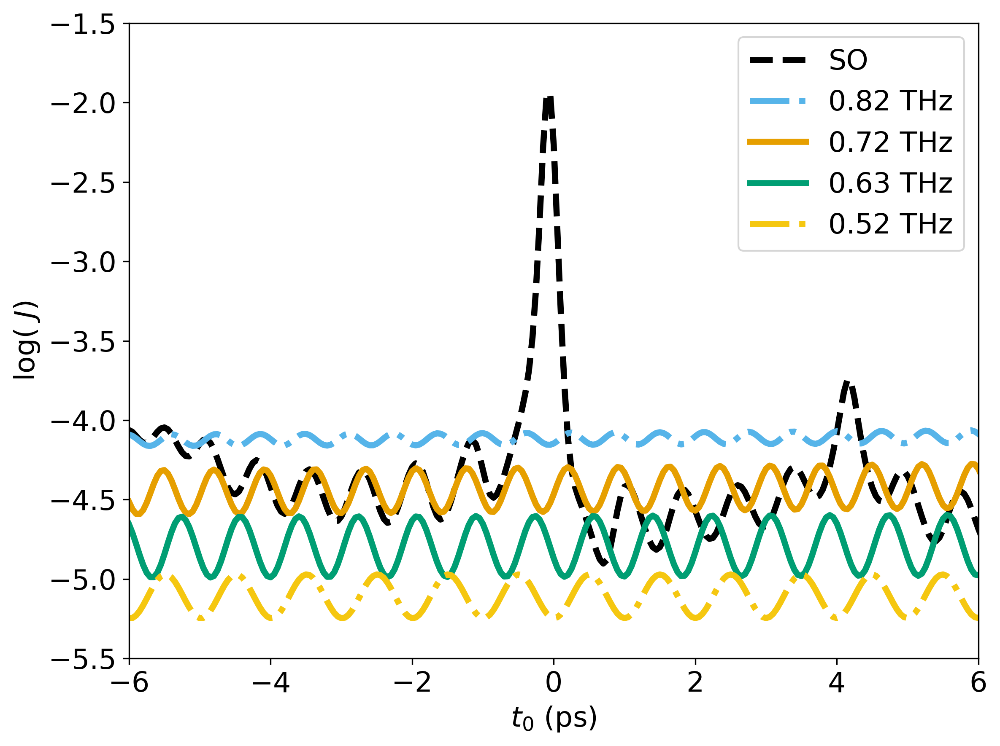

In [6]:
h3 = [_ for _ in f3.keys()]

plt.figure(num=4)
plt.plot(f3[h3[0]].T[0], f3[h3[0]].T[1], label=h3[0], linestyle='--', color=ok['black'])
plt.plot(f3[h3[1]].T[0], f3[h3[1]].T[1], label=h3[1], linestyle='-.')
plt.plot(f3[h3[2]].T[0], f3[h3[2]].T[1], label=h3[2])
plt.plot(f3[h3[3]].T[0], f3[h3[3]].T[1], label=h3[3])
plt.plot(f3[h3[4]].T[0], f3[h3[4]].T[1], label=h3[4], linestyle='-.')
plt.xlim([-6, 6])
plt.ylim([-5.5, -1.5])
plt.xlabel("$t_0$ (ps)")
plt.ylabel("log( $J$)")
plt.legend()
plt.tight_layout()
plt.savefig('./Plots/Paper/Fig3(thick).pdf')
plt.show()

## Figure 4

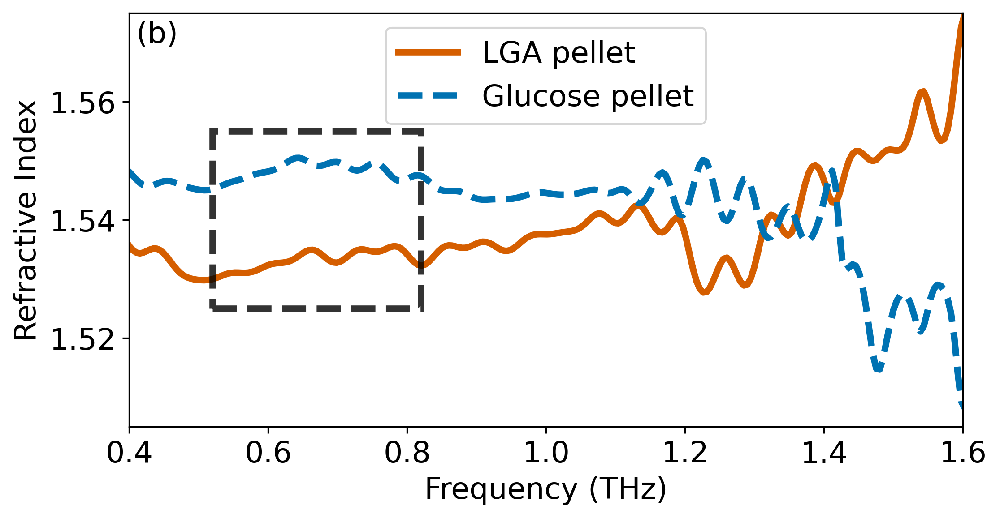

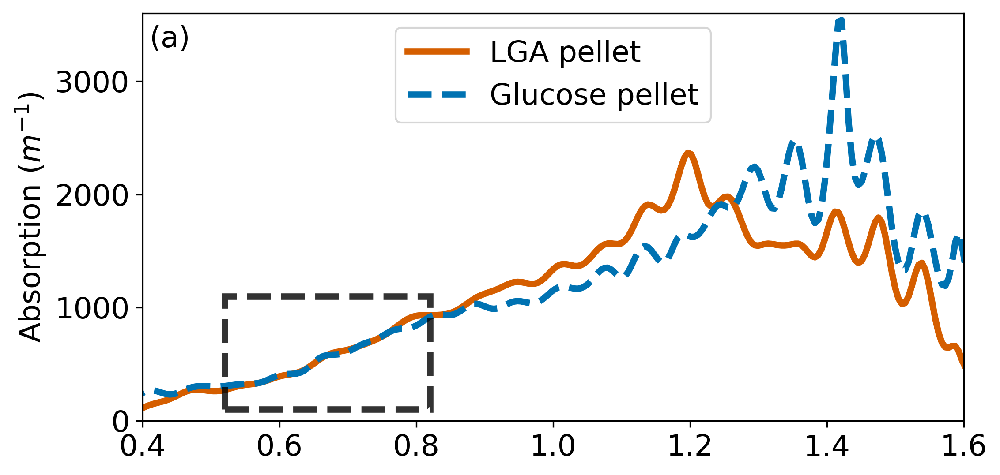

'plt.figure(figsize=(8,4))\n\nplt.plot(f4a[h4a[0]].T[0], f4a[h4a[0]].T[1], color=ok[\'red\'], label=h4a[0])\nplt.plot(f4a[h4a[1]].T[0], f4a[h4a[1]].T[1], color=ok[\'navy\'], linestyle=\'--\', label=h4a[1])\nplt.xlim([0.5, 0.8])\nplt.ylim([1.525, 1.555])\nplt.xlabel("Frequency (THz)")\nplt.ylabel("Refractive Index")\nplt.legend(loc=\'best\')\nplt.subplot().text(0.505, 1.5525, \'(b)\', fontsize=16)\nplt.subplot().add_patch(\n    patches.Rectangle((0.52, 1.525), 0.3, 0.03, linestyle=\'--\', linewidth=7, edgecolor=ok[\'black\'], \n                      facecolor=\'none\', alpha=0.8, zorder=3))\nplt.box(False)\nplt.tight_layout()\nplt.savefig(\'./Plots/Paper/Fig4bZoomed.pdf\')\nplt.show()'

In [7]:
h4a = [_ for _ in f4a.keys()]
h4b = [_ for _ in f4b.keys()]

plt.figure(num=5, figsize=(8,4))

plt.plot(f4a[h4a[0]].T[0], f4a[h4a[0]].T[1], color=ok['red'], label=h4a[0])
plt.plot(f4a[h4a[1]].T[0], f4a[h4a[1]].T[1], color=ok['navy'], linestyle='--', label=h4a[1])
plt.xlim([0.4, 1.6])
plt.ylim([1.505, 1.575])
plt.xlabel("Frequency (THz)")
plt.ylabel("Refractive Index")
plt.legend(loc='upper center')

plt.subplot().add_patch(
    patches.Rectangle((0.52, 1.525), 0.3, 0.03, linestyle='--', linewidth=3.5, edgecolor=ok['black'], 
                      facecolor='none', alpha=0.8, zorder=3))
plt.subplot().text(0.41, 1.57, '(b)', fontsize=16)

#plt.tight_layout()
plt.savefig('./Plots/Paper/Fig4b(edited).pdf')
plt.show()

plt.figure(num=6, figsize=(8,4))
plt.plot(f4b[h4b[0]].T[0], f4b[h4b[0]].T[1], color=ok['red'], label=h4b[0])
plt.plot(f4b[h4b[1]].T[0], f4b[h4b[1]].T[1], color=ok['navy'], linestyle='--', label=h4b[1])
plt.subplot().add_patch(
    patches.Rectangle((0.52, 100), 0.3, 1000, linestyle='--', linewidth=3.5, edgecolor=ok['black'], 
                      facecolor='none', alpha=0.8, zorder=3))
plt.subplot().text(0.41, 3300, '(a)', fontsize=16)
plt.xlim([0.4, 1.6])
plt.ylim([0, 3600])
#plt.xlabel("Frequency (THz)")
plt.ylabel("Absorption $(m^{-1})$")
plt.legend(loc='upper center')
#plt.gca().axes.xaxis.set_ticklabels([])
#plt.tight_layout()
plt.savefig('./Plots/Paper/Fig4a.pdf')
plt.show()

"""fig, ax1 = plt.subplots()
ax1.set_xlabel("Frequency (THz)")
ax1.set_ylabel("Refractive Index", color=ok['red'])
ax1.plot(f4a[h4a[0]].T[0], f4a[h4a[0]].T[1], color=ok['orange'], label=h4a[0])
ax1.plot(f4a[h4a[1]].T[0], f4a[h4a[1]].T[1], color=ok['red'], linestyle='--', label=h4a[1])
ax1.tick_params(axis='y', labelcolor=ok['red'])
ax1.set_ylim([1.505, 1.575])
ax1.legend(loc='upper left')

ax2 = ax1.twinx()
ax2.set_ylabel("Absorption $(m^{-1})$", color=ok['navy'])
ax2.plot(f4b[h4b[0]].T[0], f4b[h4b[0]].T[1], color=ok['blue'], label=h4b[0])
ax2.plot(f4b[h4b[1]].T[0], f4b[h4b[1]].T[1], color=ok['navy'], linestyle='--', label=h4b[1])
ax2.tick_params(axis='y', labelcolor=ok['navy'])
ax2.set_ylim([0, 3600])
plt.xlim([0.4, 1.6])
plt.tight_layout()
plt.show()"""

"""plt.figure(figsize=(8,4))

plt.plot(f4a[h4a[0]].T[0], f4a[h4a[0]].T[1], color=ok['red'], label=h4a[0])
plt.plot(f4a[h4a[1]].T[0], f4a[h4a[1]].T[1], color=ok['navy'], linestyle='--', label=h4a[1])
plt.xlim([0.5, 0.8])
plt.ylim([1.525, 1.555])
plt.xlabel("Frequency (THz)")
plt.ylabel("Refractive Index")
plt.legend(loc='best')
plt.subplot().text(0.505, 1.5525, '(b)', fontsize=16)
plt.subplot().add_patch(
    patches.Rectangle((0.52, 1.525), 0.3, 0.03, linestyle='--', linewidth=7, edgecolor=ok['black'], 
                      facecolor='none', alpha=0.8, zorder=3))
plt.box(False)
plt.tight_layout()
plt.savefig('./Plots/Paper/Fig4bZoomed.pdf')
plt.show()"""

## Figure 5

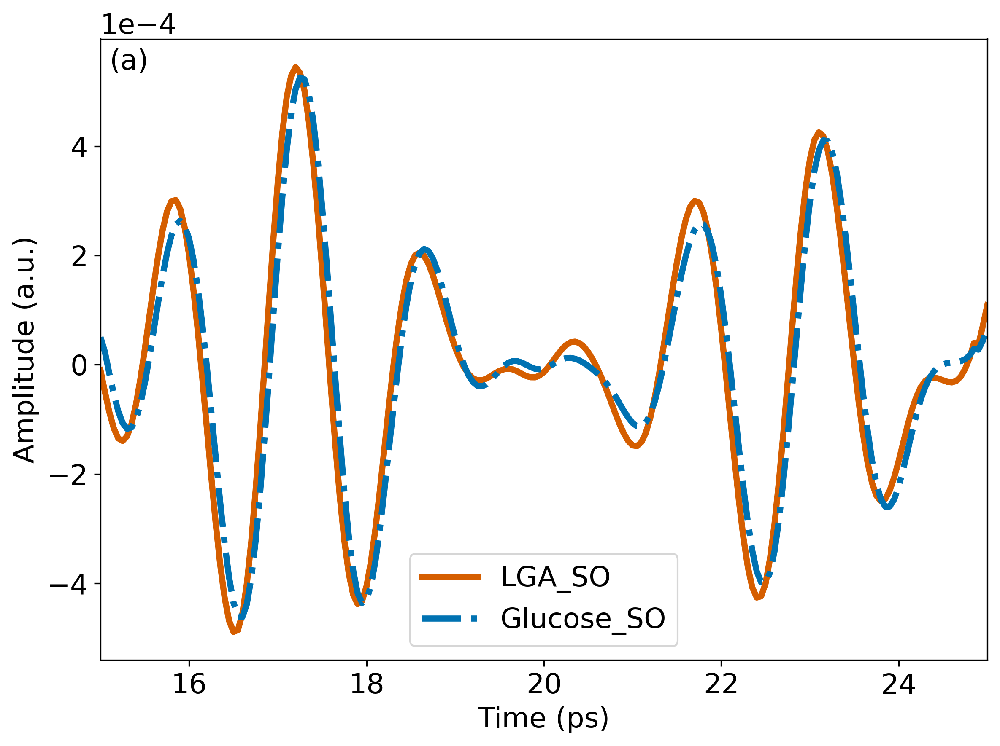

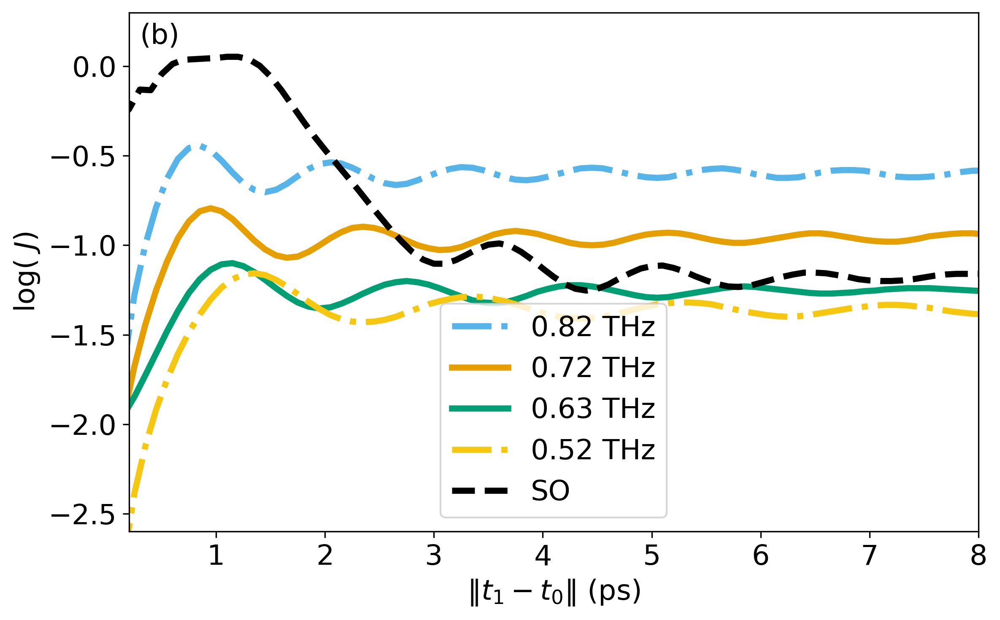

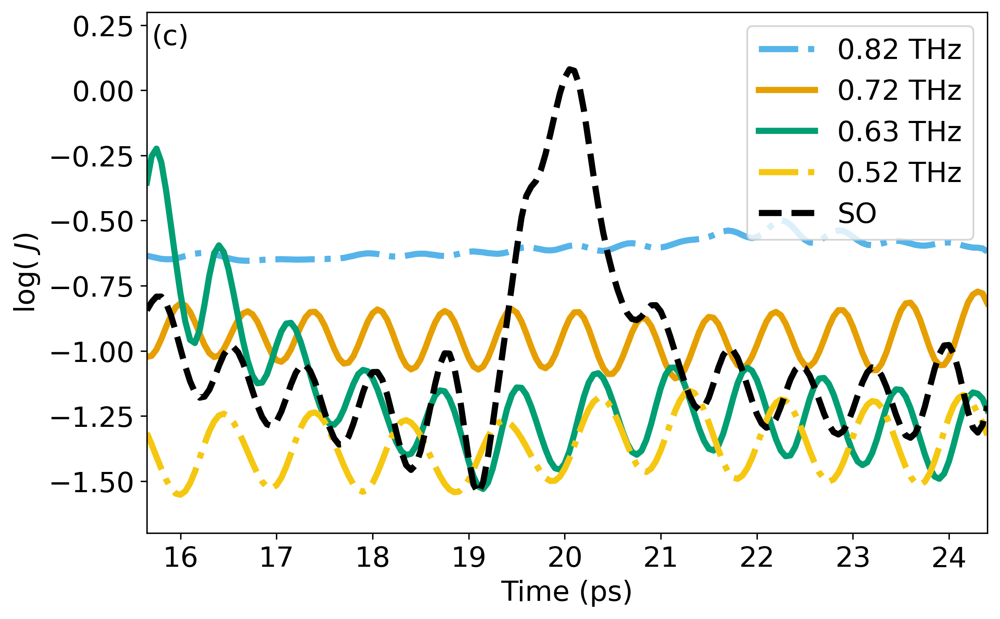

In [8]:
h5a = [_ for _ in f5a.keys()]
h5b = [_ for _ in f5b.keys()]
h5c = [_ for _ in f5c.keys()]

plt.figure(num=7)

plt.plot(f5a[h5a[0]].T[0], f5a[h5a[0]].T[1], color=ok['red'], label=h5a[0])
plt.plot(f5a[h5a[1]].T[0], f5a[h5a[1]].T[1], color=ok['navy'], linestyle='-.', label=h5a[1])
plt.xlim([f5a[h5a[0]].T[0][0],f5a[h5a[0]].T[0][-1]])
plt.xlabel("Time (ps)")
plt.ylabel("Amplitude (a.u.)")
plt.ticklabel_format(style='sci', axis='y', scilimits=(-0.00052, 0.00052))
plt.legend()

plt.subplot().text(f5a[h5a[0]].T[0][0]+0.1, 5.4e-4, '(a)', fontsize=16)

plt.tight_layout()
plt.savefig('./Plots/Paper/Fig5a.pdf')
plt.show()

plt.figure(num=8, figsize=(8,5))
plt.plot(f5b[h5b[1]].T[0], f5b[h5b[1]].T[1], label=h5b[1], linestyle='-.')
plt.plot(f5b[h5b[2]].T[0], f5b[h5b[2]].T[1], label=h5b[2])
plt.plot(f5b[h5b[3]].T[0], f5b[h5b[3]].T[1], label=h5b[3])
plt.plot(f5b[h5b[4]].T[0], f5b[h5b[4]].T[1], label=h5b[4], linestyle='-.')
plt.plot(f5b[h5b[0]].T[0], f5b[h5b[0]].T[1], label=h5b[0], linestyle='--', color=ok['black'])

plt.subplot().text(f5b['SO'].T[0][-2]+0.1, 0.125, '(b)', fontsize=16)

plt.xlim([f5b['SO'].T[0][-2], 8])
plt.ylim([-2.6, 0.3])
plt.xlabel("$\|t_1 - t_0 \|$ (ps)")
plt.ylabel("log( $J$)")
plt.legend()
plt.tight_layout()
plt.savefig('./Plots/Paper/Fig5c.pdf')
plt.show()

plt.figure(num=9, figsize=(8,5))
plt.plot(f5c[h5c[1]].T[0], f5c[h5c[1]].T[1], label=h5c[1], linestyle='-.')
plt.plot(f5c[h5c[2]].T[0], f5c[h5c[2]].T[1], label=h5c[2])
plt.plot(f5c[h5c[3]].T[0], f5c[h5c[3]].T[1], label=h5c[3])
plt.plot(f5c[h5c[4]].T[0], f5c[h5c[4]].T[1], label=h5c[4], linestyle='-.')
plt.plot(f5c[h5c[0]].T[0], f5c[h5c[0]].T[1], label=h5c[0], linestyle='--', color=ok['black'])

plt.subplot().text(f5c[h5c[0]].T[0][0]+0.05, 0.175, '(c)', fontsize=16)

plt.xlim([f5c[h5c[0]].T[0][0],f5c[h5c[0]].T[0][-1]])
plt.ylim([-1.7, 0.3])
plt.xlabel("Time (ps)")
plt.ylabel("log( $J$)")
plt.legend(loc='upper right')
plt.tight_layout()
plt.savefig('./Plots/Paper/Fig5b.pdf')
plt.show()

## Regenerating Plots for PRL

### Relative difference for samples

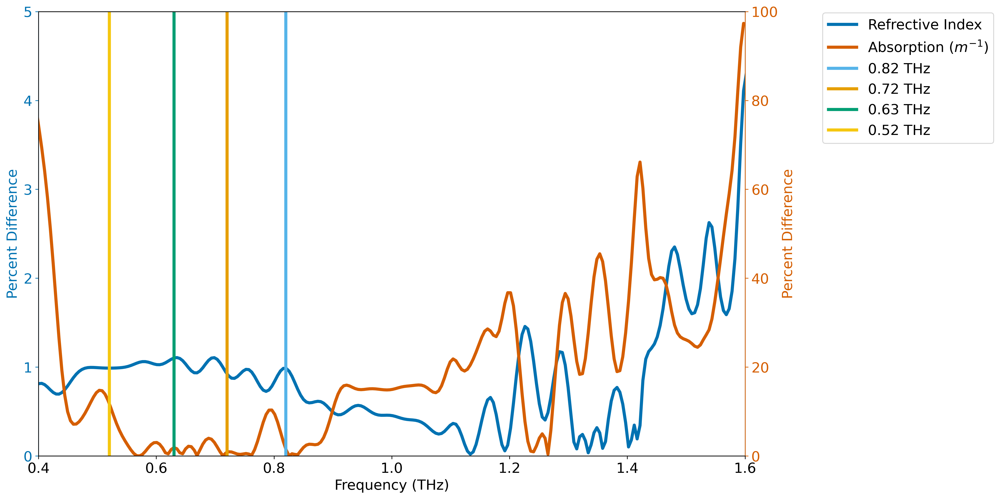

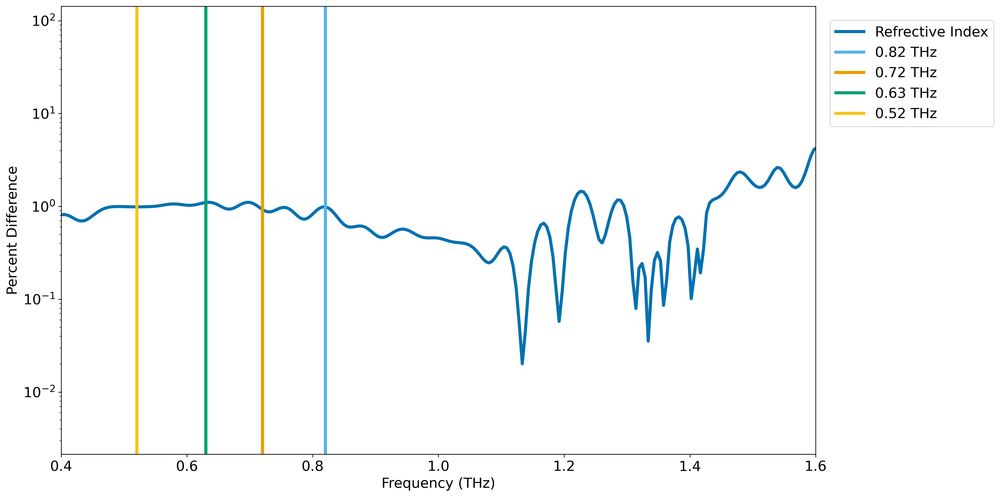

In [9]:
lga_ref = f4a[h4a[0]].T[1]
glu_ref = f4a[h4a[1]].T[1]
f_ref = f4a[h4a[0]].T[0]

lga_abs = f4b[h4b[0]].T[1]
glu_abs = f4b[h4b[1]].T[1]
f_abs = f4b[h4b[0]].T[0]


def r_diff(w1, w2):
    return 100 * np.abs(w1 - w2) / (0.5 * (np.abs(w1) + np.abs(w2)))
       
    

fig, ax1 = plt.subplots(figsize=(16,8), dpi=300)
#ax1.title()
ax1.plot(f_ref, r_diff(lga_ref, glu_ref), color = ok['navy'], label='Refrective Index')

ax1.set_xlabel("Frequency (THz)")
ax1.set_ylabel("Percent Difference", color=ok['navy'])
ax1.tick_params(axis='y', colors=ok['navy'])
ax1.spines['left'].set_color(ok['navy'])
ax1.set_xlim(0.4, 1.6)
ax1.set_ylim(0, 5)

ax2 = ax1.twinx()

ax2.plot(f_abs, r_diff(lga_abs, glu_abs), color=ok['red'], label='Absorption ($m^{-1}$)')
ax2.set_ylabel('Percent Difference', color=ok['red'])
ax2.tick_params(axis='y', colors=ok['red'])
ax2.spines['right'].set_color(ok['red'])
ax2.set_ylim(0, 100)

plt.axvline(0.82, color=ok['blue'], label='0.82 THz')
plt.axvline(0.72, color=ok['orange'], label='0.72 THz')
plt.axvline(0.63, color=ok['green'], label='0.63 THz')
plt.axvline(0.52, color=ok['amber'], label='0.52 THz')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='center left', bbox_to_anchor=(1.1, 0.85))
plt.tight_layout()
plt.savefig('./Plots/Paper/RelativeDiff.pdf')
plt.show()

plt.figure(figsize=(16, 8), dpi=300)
plt.semilogy(f_ref, r_diff(lga_ref, glu_ref), color = ok['navy'], label='Refrective Index')
#plt.semilogy(f_abs, r_diff(lga_abs, glu_abs), color=ok['red'], label='Absorption ($m^{-1}$)')
plt.xlim(0.4, 1.6)
#plt.ylim(0, 100)
plt.axvline(0.82, color=ok['blue'], label='0.82 THz')
plt.axvline(0.72, color=ok['orange'], label='0.72 THz')
plt.axvline(0.63, color=ok['green'], label='0.63 THz')
plt.axvline(0.52, color=ok['amber'], label='0.52 THz')
plt.xlabel('Frequency (THz)')
plt.ylabel('Percent Difference')
plt.legend(loc='center left', bbox_to_anchor=(1.01, 0.85))
plt.tight_layout()
plt.savefig('./Plots/Paper/PercentDiff_RI_semilogy.pdf')
plt.show()

### New Sample Plots

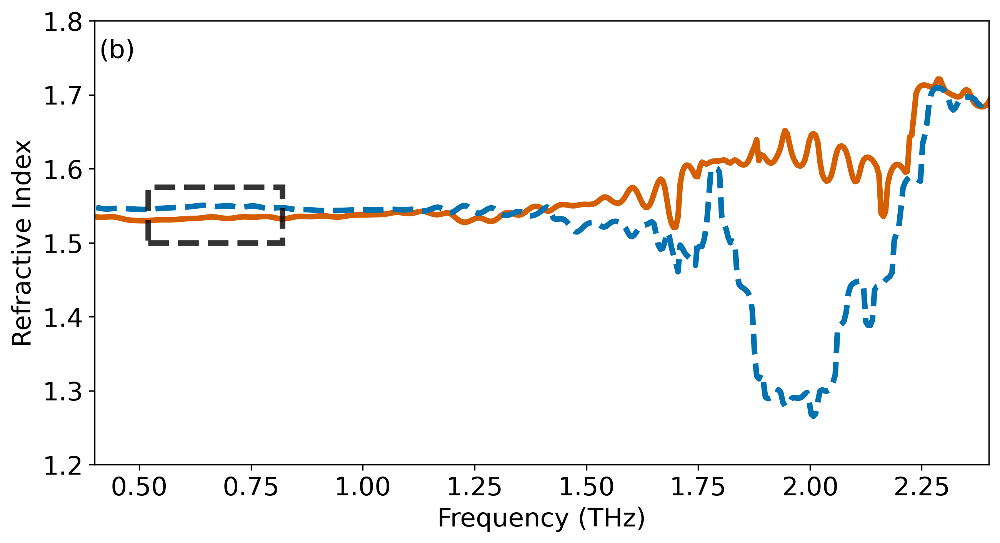

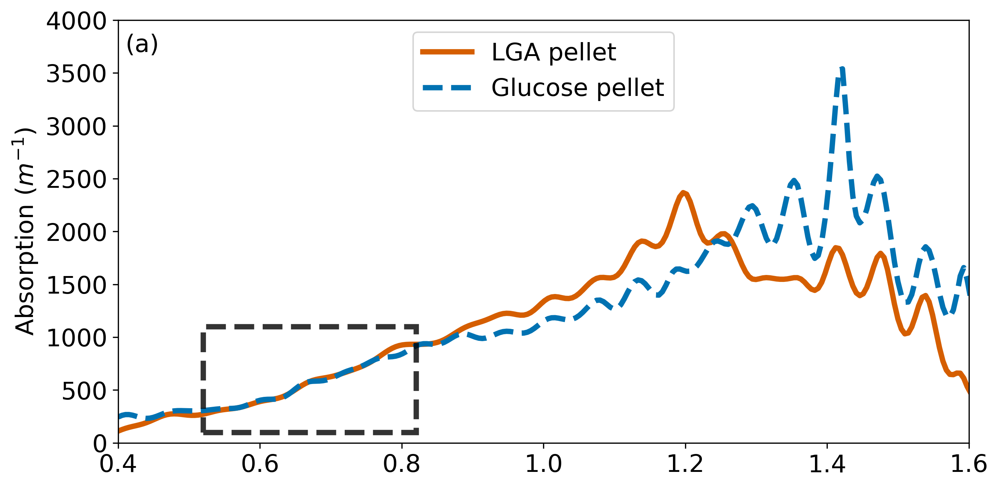

In [10]:
plt.figure(figsize=(10,5))
plt.plot(f4a[h4a[0]].T[0], f4a[h4a[0]].T[1], color=ok['red'], label=h4a[0])
plt.plot(f4a[h4a[1]].T[0], f4a[h4a[1]].T[1], color=ok['navy'], linestyle='--', label=h4a[1])
"""plt.axvline(0.52, color=ok['blue'], alpha=0.9, label='Fundamental Harmonics')
plt.axvline(0.63, color=ok['blue'], alpha=0.9)
plt.axvline(0.72, color=ok['blue'], alpha=0.9)
plt.axvline(0.82, color=ok['blue'], alpha=0.9)"""
plt.xlim([0.4, 2.4])
plt.ylim([1.2, 1.8])
plt.xlabel("Frequency (THz)")
plt.ylabel("Refractive Index")
#plt.legend(loc='upper center')

plt.subplot().add_patch(
    patches.Rectangle((0.52, 1.5), 0.3, 0.075, linestyle='--', linewidth=3.5, edgecolor=ok['black'], 
                      facecolor='none', alpha=0.8, zorder=3))
plt.subplot().text(0.41, 1.75, '(b)', fontsize=16)

#plt.tight_layout()
plt.savefig('./Plots/Paper/RefractiveIndex_Box_nolegend.pdf')
plt.show()

plt.figure(figsize=(10,5))
plt.plot(f4b[h4b[0]].T[0], np.abs(f4b[h4b[0]].T[1]), color=ok['red'], label=h4b[0])
plt.plot(f4b[h4b[1]].T[0], np.abs(f4b[h4b[1]].T[1]), color=ok['navy'], linestyle='--', label=h4b[1])
plt.subplot().add_patch(
    patches.Rectangle((0.52, 100), 0.3, 1000, linestyle='--', linewidth=3.5, edgecolor=ok['black'], 
                      facecolor='none', alpha=0.8, zorder=3))
"""plt.axvline(0.52, color=ok['blue'], alpha=0.9, label='Fundamental Harmonics')
plt.axvline(0.63, color=ok['blue'], alpha=0.9)
plt.axvline(0.72, color=ok['blue'], alpha=0.9)
plt.axvline(0.82, color=ok['blue'], alpha=0.9)"""
plt.subplot().text(0.41, 3700, '(a)', fontsize=16)
plt.xlim([0.4, 1.6])
plt.ylim([0, 4000])
#plt.xlabel("Frequency (THz)")
plt.ylabel("Absorption $(m^{-1})$")
plt.legend(loc='upper center')
#plt.gca().axes.xaxis.set_ticklabels([])
#plt.tight_layout()
plt.savefig('./Plots/Paper/Absorption_Box.pdf')
plt.show()

### New Fields

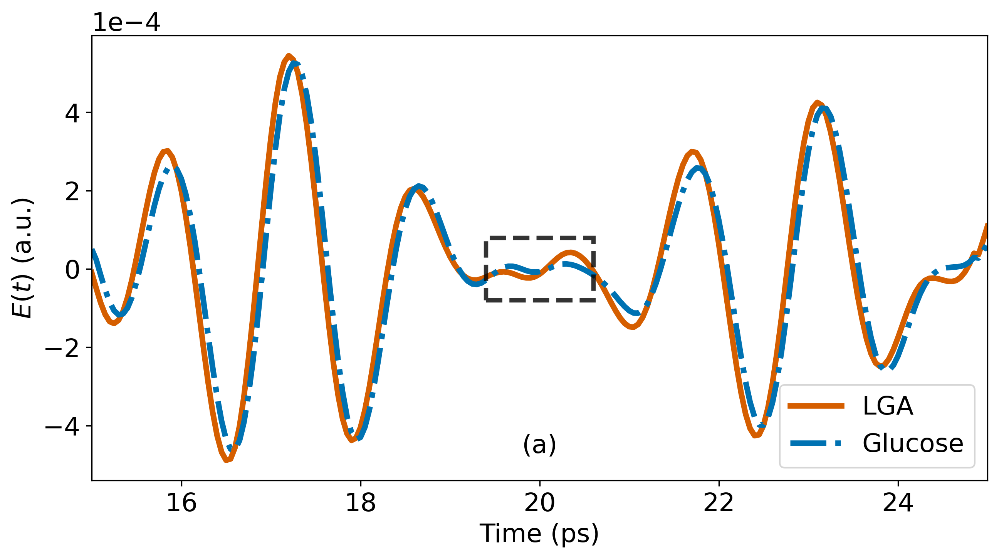

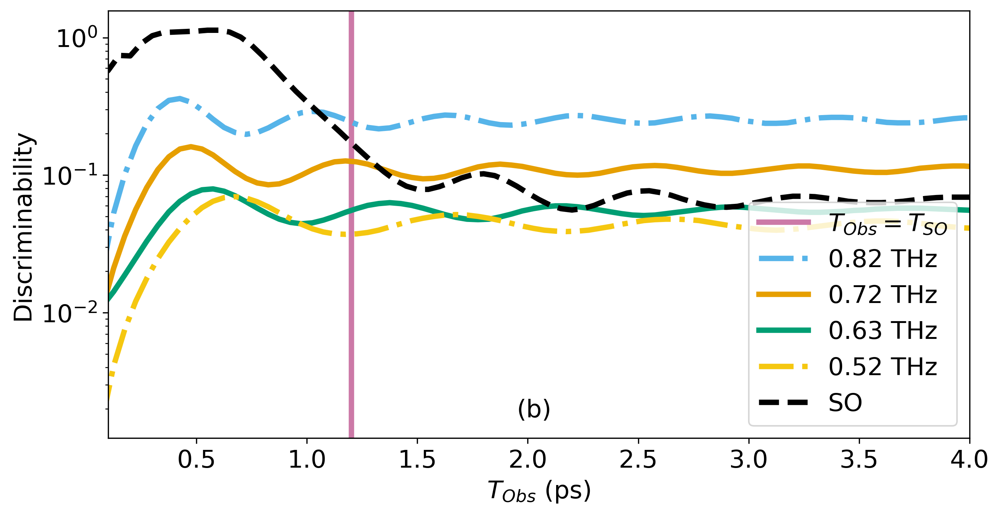

In [11]:
plt.figure(figsize=(10,5))

plt.plot(f5a[h5a[0]].T[0], f5a[h5a[0]].T[1], color=ok['red'], label="LGA")
plt.plot(f5a[h5a[1]].T[0], f5a[h5a[1]].T[1], color=ok['navy'], linestyle='-.', label="Glucose")
plt.xlim([f5a[h5a[0]].T[0][0],f5a[h5a[0]].T[0][-1]])
plt.xlabel("Time (ps)")
plt.ylabel("$E(t)$ (a.u.)")
plt.subplot().add_patch(
    patches.Rectangle((20-0.6, -.8e-4), 1.2, 1.6e-4, linestyle='--', linewidth=2.75, edgecolor=ok['black'], 
                      facecolor='none', alpha=0.8, zorder=3)) #, label='Superoscillating region'))
plt.ticklabel_format(style='sci', axis='y', scilimits=(-0.00052, 0.00052))
plt.legend()
#plt.subplot().text(f5a[h5a[0]].T[0][0]+0.1, 5.2e-4, '(a)', fontsize=16)
plt.subplot().text(19.8, -4.7e-4, '(a)', fontsize=16)
#plt.tight_layout()
plt.savefig('./Plots/Paper/MeasuredWaves.pdf')
plt.show()

plt.figure(figsize=(10,5))
plt.axvline(1.2, color=ok['purple'], label='$T_{Obs} = T_{SO}$')
plt.semilogy(f5b[h5b[1]].T[0] * 0.5, (10 ** f5b[h5b[1]]).T[1], label=h5b[1], linestyle='-.')
plt.semilogy(f5b[h5b[2]].T[0] * 0.5, (10 ** f5b[h5b[2]]).T[1], label=h5b[2])
plt.semilogy(f5b[h5b[3]].T[0] * 0.5, (10 ** f5b[h5b[3]]).T[1], label=h5b[3])
plt.semilogy(f5b[h5b[4]].T[0] * 0.5, (10 ** f5b[h5b[4]]).T[1], label=h5b[4], linestyle='-.')
plt.semilogy(f5b[h5b[0]].T[0] * 0.5, (10 ** f5b[h5b[0]]).T[1], label=h5b[0], linestyle='--', color=ok['black'])

plt.subplot().text(1.95, 1.75e-3, '(b)', fontsize=16)

plt.xlim([0.1, 4])
#plt.ylim([-2.62, 0.3])
plt.xlabel("$T_{Obs}$ (ps)")
plt.ylabel("Discriminability")
plt.legend(loc='lower right')
#plt.tight_layout()
plt.savefig('./Plots/Paper/MeasuredJ.pdf')
plt.show()

# Double Checking Data

In [12]:
glucose = np.load('./ExpData/Glucose_SO.npz')
lga = np.load('./ExpData/LGA_SO.npz')
thz052_glu = np.load('./ExpData/Glucose_F05.npz')
thz063_glu = np.load('./ExpData/Glucose_F06.npz')
thz072_glu = np.load('./ExpData/Glucose_F07.npz')
thz082_glu = np.load('./ExpData/Glucose_F08.npz')
thz052_lga = np.load('./ExpData/LGA_F05.npz')
thz063_lga = np.load('./ExpData/LGA_F06.npz')
thz072_lga = np.load('./ExpData/LGA_F07.npz')
thz082_lga = np.load('./ExpData/LGA_F08.npz')

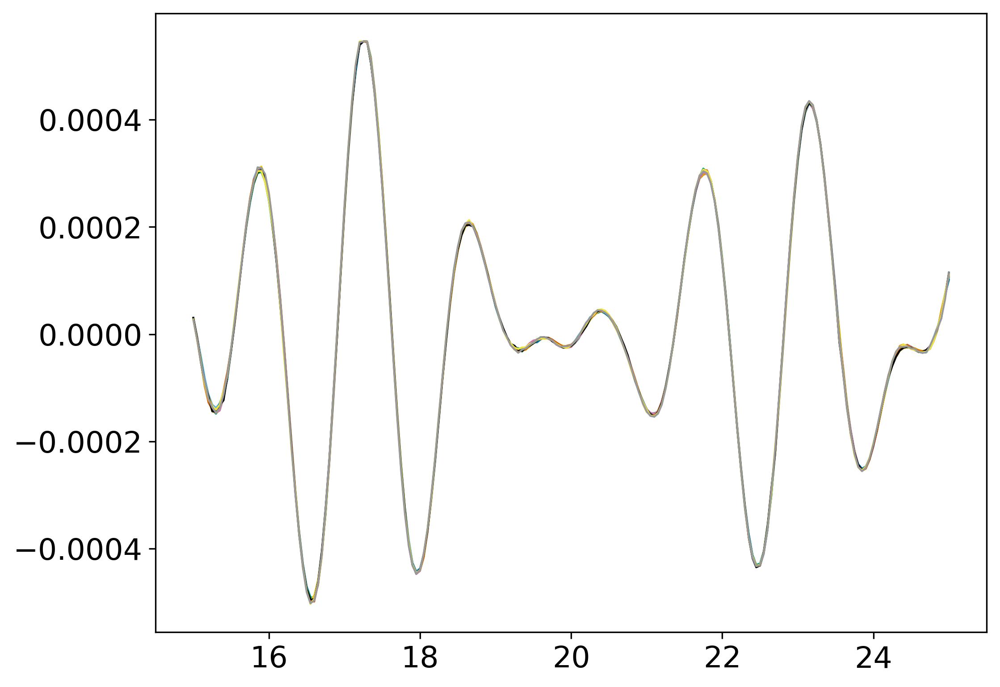

In [13]:
lga_amps = lga['amplitude'].T
lga_times = lga['time'].T
glu_amps = glucose['amplitude'].T
glu_times = glucose['time'].T
glu_thz05_t = thz052_glu['time'].T
glu_thz06_t = thz063_glu['time'].T
glu_thz07_t = thz072_glu['time'].T
glu_thz08_t = thz082_glu['time'].T
lga_thz05_t = thz052_lga['time'].T
lga_thz06_t = thz063_lga['time'].T
lga_thz07_t = thz072_lga['time'].T
lga_thz08_t = thz082_lga['time'].T
glu_source = [thz052_glu['amplitude'].T, 
              thz063_glu['amplitude'].T, 
              thz072_glu['amplitude'].T,
              thz082_glu['amplitude'].T]
lga_source = [thz052_lga['amplitude'].T, 
              thz063_lga['amplitude'].T, 
              thz072_lga['amplitude'].T,
              thz082_lga['amplitude'].T]

paper_lga = f5a[h5a[0]].T[1]
paper_glu = f5a[h5a[1]].T[1]

# This is sufficient for all sources and lga/glucose SO
# I have double checked all time arrays and they are all identical
source_times = glu_times[0] - 20


for _ in range(0, len(lga_times)):
    plt.plot(lga_times[_], lga_amps[_], linewidth=1.0)

plt.show()

In [14]:
def get_std_err(ampl_array, avg):
    error_array = np.zeros(len(avg))
    for _ in ampl_array:
        error_array += _ - avg
    return np.sqrt(error_array ** 2) / len(ampl_array)

def get_fields(_fields):
    # TO implement, take mean and \pm err_lower_ and err_upper  
    field = np.mean(_fields, axis=0)
    
    # Substract the mean from experimental fields to compensate for parasitic offset
    field -= field.mean()
    
    # calculate the confidence interval
    confidence_level = 0.95
    
    sigma = stats.sem(_fields, axis=0)
    sigma = np.clip(sigma, 1e-20, sigma.max())
    
    err_lower_bound, err_upper_bound = stats.t.interval(
        confidence_level, 
        _fields.shape[0], 
        field, 
        sigma,
    )
    return field, [err_lower_bound, err_upper_bound]

def get_j(e1, e2, times, delta):
    # e1-= np.average(e1)
    # e2-= np.average(e2)
    num = simps(np.abs(e1[delta] - e2[delta]) **2, times[delta])
    den = 0.5 * simps(np.abs(e1[delta]) ** 2 + np.abs(e2[delta]) ** 2, times[delta])
    if den == 0:
        print("Warning, the denominator is {}, the delta was {}".format(den, delta))
    return num/den

def get_J_error(e1, e2, de1, de2, Δ):
    # J = a / b
    # dJdE = 
    a = np.sum(np.abs(e1[Δ] - e2[Δ]) ** 2)
    dax = 2 * (e1 - e2)
    day = 2 * (e2 - e1)
    b = np.sum(np.abs(e1[Δ]) ** 2 + np.abs(e2[Δ]) ** 2)
    dbx = 2 * e1
    dby = 2 * e2
    dJde1 = (b * dax - a * dbx) /  (b ** 2)
    dJde2 = (b * dby - a * dby) / (b ** 2)
    return np.sqrt(np.sum((dJde1 * de1)[Δ] ** 2) + np.sum((dJde2 * de2)[Δ] ** 2))

def get_local_freq(pulse):
    phase = np.unwrap(np.angle(hilbert(pulse.field)), discont=np.pi/2)
    return np.gradient(phase, np.pi / (pulse.time.max() - pulse.time.min()))

In [15]:
# Here is where we get all of the averages and errors
glu05, glu05_err = get_fields(glu_source[0])
lga05, lga05_err = get_fields(lga_source[0])
glu06, glu06_err = get_fields(glu_source[1])
lga06, lga06_err = get_fields(lga_source[1])
glu07, glu07_err = get_fields(glu_source[2])
lga07, lga07_err = get_fields(lga_source[2])
glu08, glu08_err = get_fields(glu_source[3])
lga08, lga08_err = get_fields(lga_source[3])

glu_SO, glu_SO_err = get_fields(glu_amps)
lga_SO, lga_SO_err = get_fields(lga_amps)

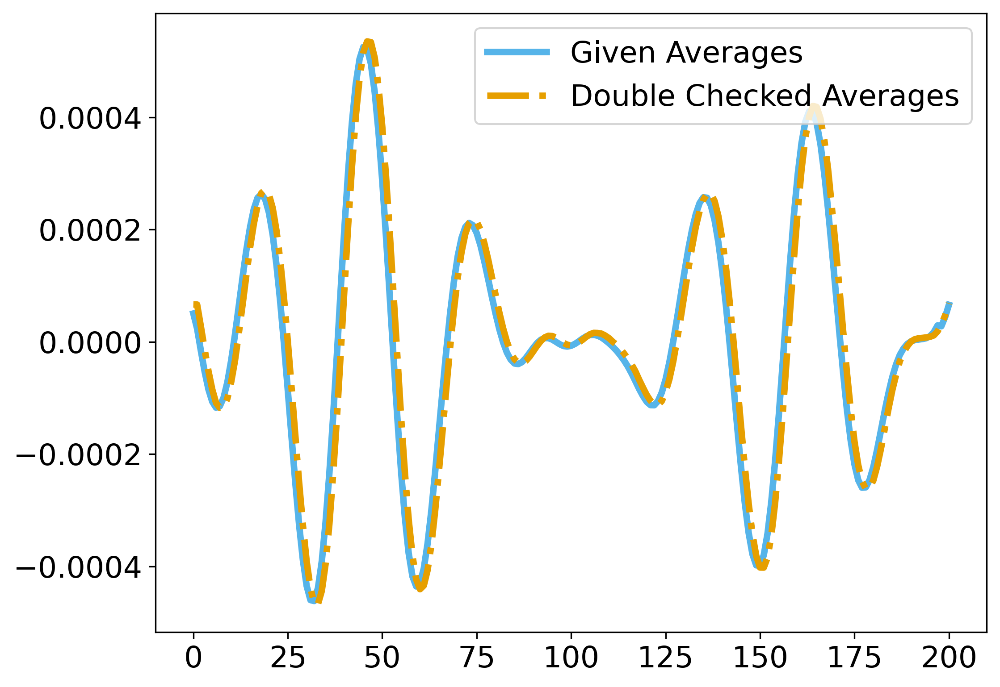

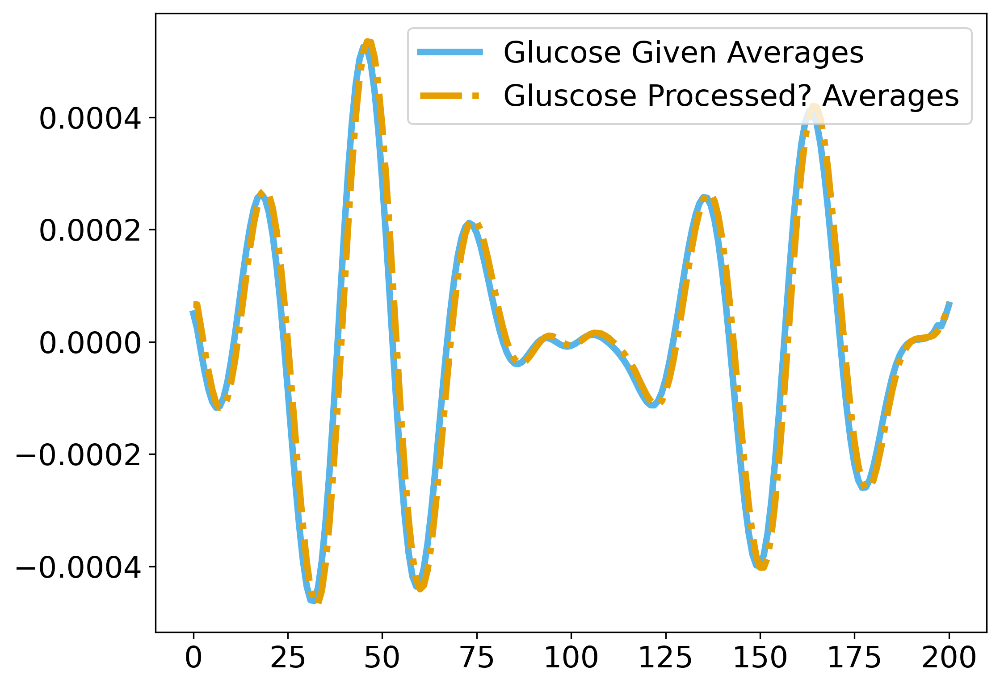

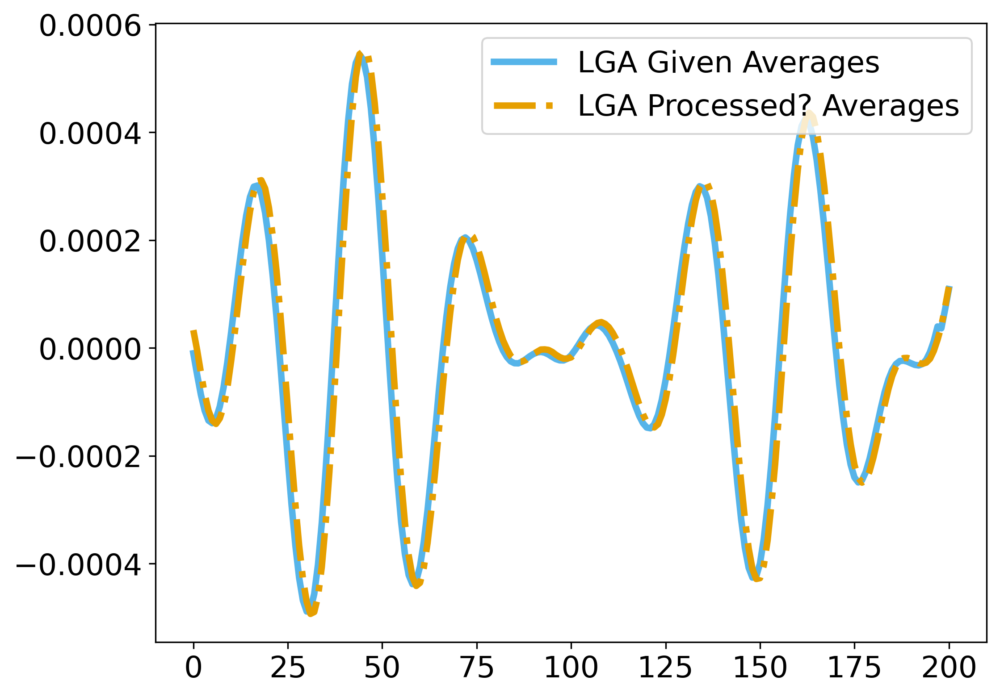

In [16]:
# THIS IS THE PROBLEM. THE PLOTS FROM THE PAPER DO NOT MATCH THE MEASURED DATA
plt.plot(paper_glu, label='Given Averages')
plt.plot(glu_SO, linestyle='-.', label='Double Checked Averages')
plt.legend()
plt.show()

# Try suggested post processing
new_glu = np.average(glu_amps, axis=0)
new_glu -= np.average(new_glu)
new_lga = np.average(lga_amps, axis=0)
new_lga -= np.average(new_lga)


plt.plot(paper_glu, label='Glucose Given Averages')
plt.plot(new_glu, linestyle='-.', label='Gluscose Processed? Averages')
plt.legend()
plt.show()

plt.plot(paper_lga, label='LGA Given Averages')
plt.plot(new_lga, linestyle='-.', label='LGA Processed? Averages')
plt.legend()
plt.show()

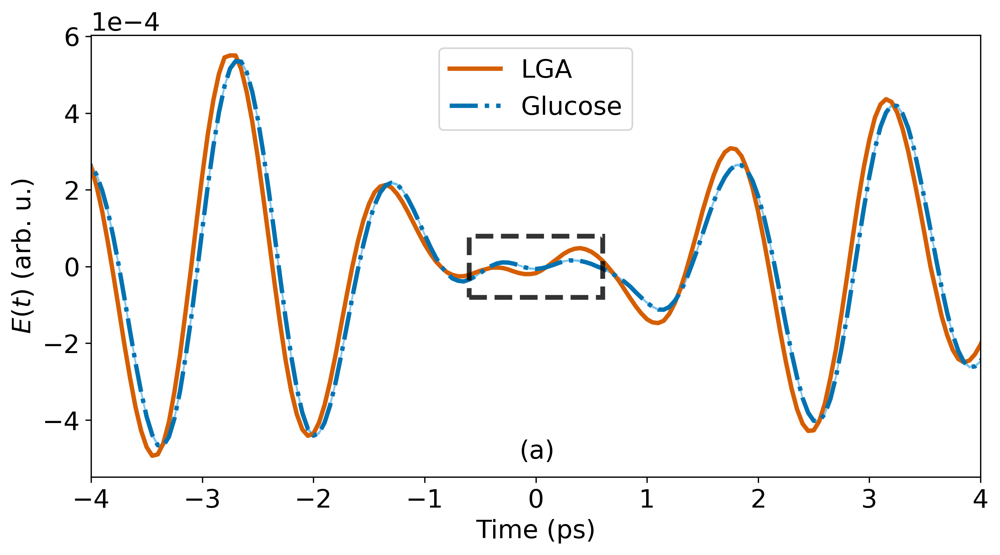

In [17]:
# NOTE: The standard error in these plots is wrong
# Now that the problem is known, we need to regenerate this

plt.figure(figsize=(10,5))
plt.plot(source_times, lga_SO, color=ok['red'], linewidth=2.75, label='LGA')
plt.plot(source_times, glu_SO, color=ok['navy'], linewidth=2.75, linestyle="-.", label='Glucose')
plt.subplot().add_patch(
    patches.Rectangle((-0.6, -.8e-4), 1.2, 1.6e-4, linestyle='--', linewidth=3, edgecolor=ok['black'], 
                      facecolor='none', alpha=0.8, zorder=3)) #, label='Superoscillating region'))
plt.fill_between(source_times, lga_SO_err[0], lga_SO_err[1], color=ok['orange'], alpha=0.66)
plt.fill_between(source_times, glu_SO_err[0], glu_SO_err[1], color=ok['blue'], alpha=0.66)
plt.subplot().text(-0.15, -5e-4, '(a)', fontsize=16)
plt.ticklabel_format(style='sci', axis='y', scilimits=(-0.00052, 0.00052))
plt.xlim(-4, 4)
plt.xlabel('Time (ps)')
plt.ylabel('$E(t)$ (arb. u.)')
plt.legend(loc='upper center')
plt.savefig('./Plots/Paper/FieldsWithStudentError.pdf')


In [18]:
(lga_SO_err[1] - lga_SO_err[0])/2

array([1.11676370e-06, 1.67885724e-06, 2.64217603e-06, 3.18972031e-06,
       3.41005358e-06, 3.10005085e-06, 2.45235449e-06, 3.31770133e-06,
       3.94488605e-06, 2.89546584e-06, 1.44885784e-06, 2.46635737e-06,
       1.67662740e-06, 1.02050922e-06, 1.42609087e-06, 2.06440655e-06,
       2.16413211e-06, 2.25392774e-06, 2.11717749e-06, 3.20106042e-06,
       3.56214926e-06, 2.83973652e-06, 2.41286669e-06, 3.89285616e-06,
       4.69369089e-06, 3.18091818e-06, 3.05258059e-06, 1.77671236e-06,
       1.87749490e-06, 1.83172665e-06, 2.41205862e-06, 3.14494377e-06,
       2.57010244e-06, 1.92557912e-06, 2.22948387e-06, 2.75212943e-06,
       2.00798116e-06, 2.88457366e-06, 2.39490656e-06, 2.10971545e-06,
       2.66352397e-06, 2.60482212e-06, 2.89195829e-06, 3.33290523e-06,
       1.73470209e-06, 0.00000000e+00, 4.49159610e-07, 2.68046956e-06,
       2.10747453e-06, 2.66420153e-06, 2.27599824e-06, 2.60054181e-06,
       2.43311448e-06, 2.49422881e-06, 2.78586915e-06, 2.66345697e-06,
      

In [19]:
source_J = np.empty(shape=(4, 10)+(0,)).tolist()
SO_J = [[], [], [], [], [], [], [], [], [], []]
tObs = []

source_J_avg = [[], [], [], []]
SO_J_avg = []


ub = int(len(source_times)/2)           
for _ in range(ub):
        wedge = slice((ub- _ - 1), (ub + _ + 1)) # len(source_times) - _)
        tObs.append(source_times[ub + _ + 1])
        # Here we calculate J from the averaged fields
        source_J_avg[0].append(get_j(glu05, lga05, source_times, wedge))
        source_J_avg[1].append(get_j(glu06, lga06, source_times, wedge))
        source_J_avg[2].append(get_j(glu07, lga07, source_times, wedge))
        source_J_avg[3].append(get_j(glu08, lga08, source_times, wedge))
        SO_J_avg.append(get_j(glu_SO, lga_SO, source_times, wedge))
        #print('tObs added: {}'.format(source_times[ub + _ + 1]))
        for i in range(len(glu_amps)):
            # Here we calculate J for each field, and then we average
            # This will give us some idea of the error
            SO_J[i].append(get_j(glu_amps[i], lga_amps[i], source_times, wedge))
            source_J[0][i].append(get_j(glu_source[0][i], lga_source[0][i], source_times, wedge))
            source_J[1][i].append(get_j(glu_source[1][i], lga_source[1][i], source_times, wedge))
            source_J[2][i].append(get_j(glu_source[2][i], lga_source[2][i], source_times, wedge))
            source_J[3][i].append(get_j(glu_source[3][i], lga_source[3][i], source_times, wedge))
            
avg05 = np.average(source_J[0], axis=0)
avg06 = np.average(source_J[1], axis=0)
avg07 = np.average(source_J[2], axis=0)
avg08 = np.average(source_J[3], axis=0)

avgSO = np.average(SO_J, axis=0)

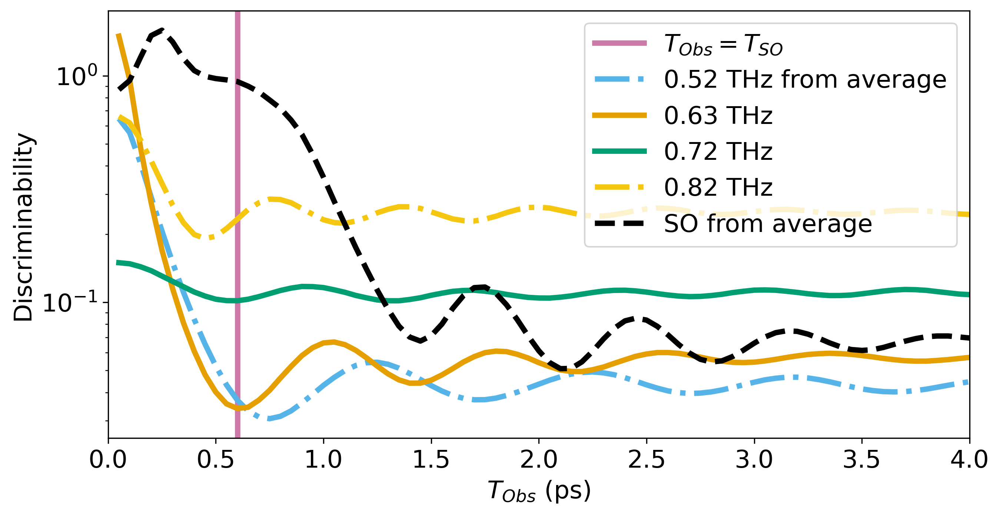

In [20]:
plt.figure(figsize=(10,5))
plt.axvline(0.6, color=ok['purple'], label='$T_{Obs} = T_{SO}$')

plt.semilogy(tObs, source_J_avg[0], label='0.52 THz from average', color=ok['blue'], linestyle='-.')
#plt.semilogy(tObs, avg05, label='0.52 THz averaged', color=ok['navy'], linestyle='-')
plt.semilogy(tObs, source_J_avg[1], label='0.63 THz', color=ok['orange'])
plt.semilogy(tObs, source_J_avg[2], label='0.72 THz', color=ok['green'])
plt.semilogy(tObs, source_J_avg[3], label='0.82 THz', color=ok['amber'], linestyle='-.')

#plt.semilogy(tObs, avgSO, label='SO averaged', color=ok['grey'], linestyle='--')
plt.semilogy(tObs, SO_J_avg, label='SO from average', color=ok['black'], linestyle='--')
#plt.semilogy(f5b[h5b[0]].T[0] * 0.5, (10 ** f5b[h5b[0]]).T[1], 
#             label="Original Plot SO", linestyle='--', color=ok['red'])

plt.xlim(0, 4)
plt.xlabel('$T_{Obs}$ (ps)')
plt.ylabel('Discriminability')
plt.legend()
plt.savefig('./Plots/Paper/DiscriminabilityAveragesFinished.pdf')
plt.show()

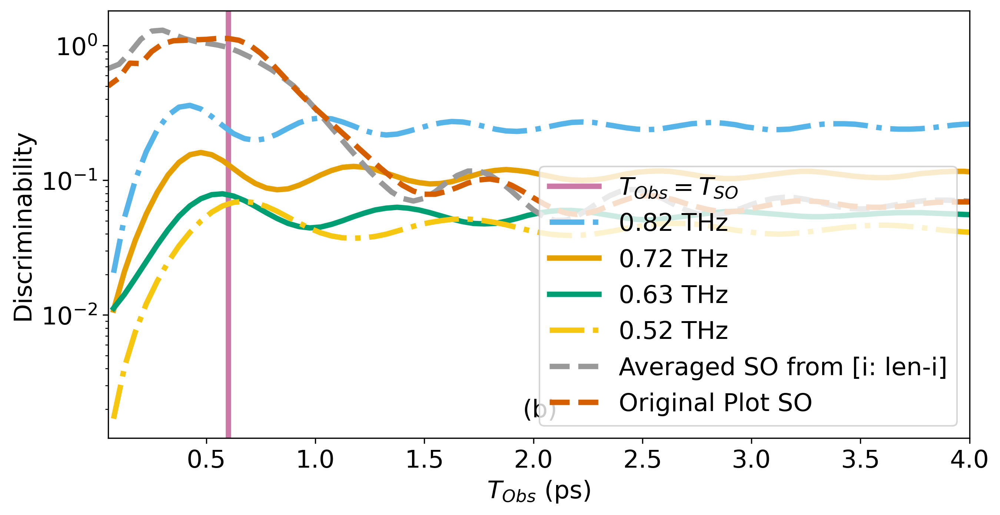

In [21]:


plt.figure(figsize=(10,5))
plt.axvline(0.6, color=ok['purple'], label='$T_{Obs} = T_{SO}$')
plt.semilogy(f5b[h5b[1]].T[0] * 0.5, (10 ** f5b[h5b[1]]).T[1], label=h5b[1], linestyle='-.')
plt.semilogy(f5b[h5b[2]].T[0] * 0.5, (10 ** f5b[h5b[2]]).T[1], label=h5b[2])
plt.semilogy(f5b[h5b[3]].T[0] * 0.5, (10 ** f5b[h5b[3]]).T[1], label=h5b[3])
plt.semilogy(f5b[h5b[4]].T[0] * 0.5, (10 ** f5b[h5b[4]]).T[1], label=h5b[4], linestyle='-.')


plt.semilogy(tObs, avgSO, label = 'Averaged SO from [i: len-i]', linestyle='--', color=ok['grey'])
plt.semilogy(f5b[h5b[0]].T[0] * 0.5, (10 ** f5b[h5b[0]]).T[1], label="Original Plot SO", linestyle='--', color=ok['red'])

plt.subplot().text(1.95, 1.75e-3, '(b)', fontsize=16)

plt.xlim([0.05, 4])
#plt.ylim([-2.62, 0.3])
plt.xlabel("$T_{Obs}$ (ps)")
plt.ylabel("Discriminability")
plt.legend(loc='lower right')
#plt.tight_layout()
plt.savefig('./Plots/Paper/MeasuredJShiftedTestingWithCorrection.pdf')
plt.show()

In [22]:

δE105 = glu05_err[1] - glu05
δE106 = glu06_err[1] - glu06
δE107 = glu07_err[1] - glu07
δE108 = glu08_err[1] - glu08


δE205 = lga05_err[1] - lga05
δE206 = lga06_err[1] - lga06
δE207 = lga07_err[1] - lga07
δE208 = lga08_err[1] - lga08


δE1SO = glu_SO_err[1] - glu_SO
δE2SO = lga_SO_err[1] - lga_SO


In [23]:
print(np.average(δE105, axis=0))
print(np.average(δE205, axis=0))
print(np.average(get_std_err(source_J[0], avg05), axis=0))
print( '\n')
print(np.average(δE106, axis=0))
print(np.average(δE206, axis=0))
print(np.average(get_std_err(source_J[1], avg06), axis=0))
print( '\n')
print(np.average(δE107, axis=0))
print(np.average(δE207, axis=0))
print(np.average(get_std_err(source_J[2], avg07), axis=0))
print( '\n')
print(np.average(δE108, axis=0))
print(np.average(δE208, axis=0))
print(np.average(get_std_err(source_J[3], avg08), axis=0))
print( '\n')
print(np.average(δE1SO, axis=0))
print(np.average(δE2SO, axis=0))
print(np.average(get_std_err(SO_J, avgSO), axis=0))


9.604915449003306e-07
1.3331856415361754e-06
5.804384750618396e-18


6.063232343654529e-07
8.054246992573539e-07
6.224187831804784e-18


1.0801973726877626e-06
1.2518407563421768e-06
9.658940314238861e-18


9.35699326602391e-07
1.1582462102914334e-06
2.1926904736346836e-17


1.6473388174238747e-06
1.8083897673461755e-06
1.8963997039378456e-17


In [24]:
err05 = []
err06 = []
err07 = []
err08 = []
errSO = []

for _ in range(ub):
    wedge = slice((ub - _ - 1), (ub + _ + 1))
    err05.append(get_J_error(glu05, lga05, δE105, δE205, wedge))
    err06.append(get_J_error(glu06, lga06, δE106, δE206, wedge))
    err07.append(get_J_error(glu07, lga07, δE107, δE207, wedge))
    err08.append(get_J_error(glu08, lga08, δE108, δE208, wedge))

    errSO.append(get_J_error(glu_SO, lga_SO, δE1SO, δE2SO, wedge))

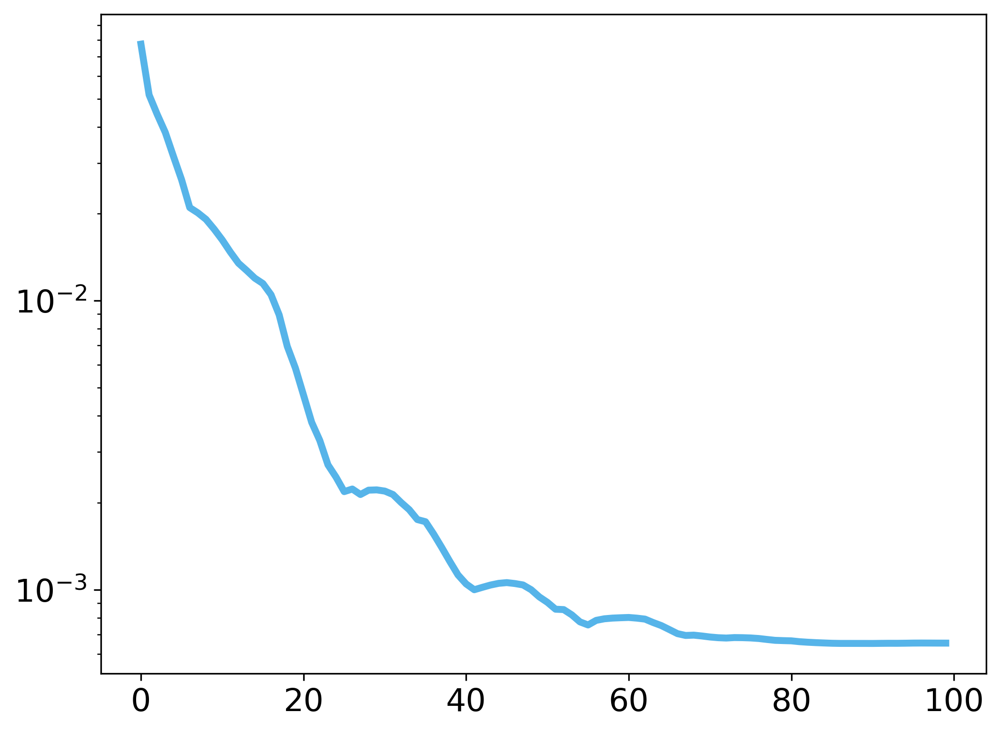

In [25]:
plt.semilogy(errSO)


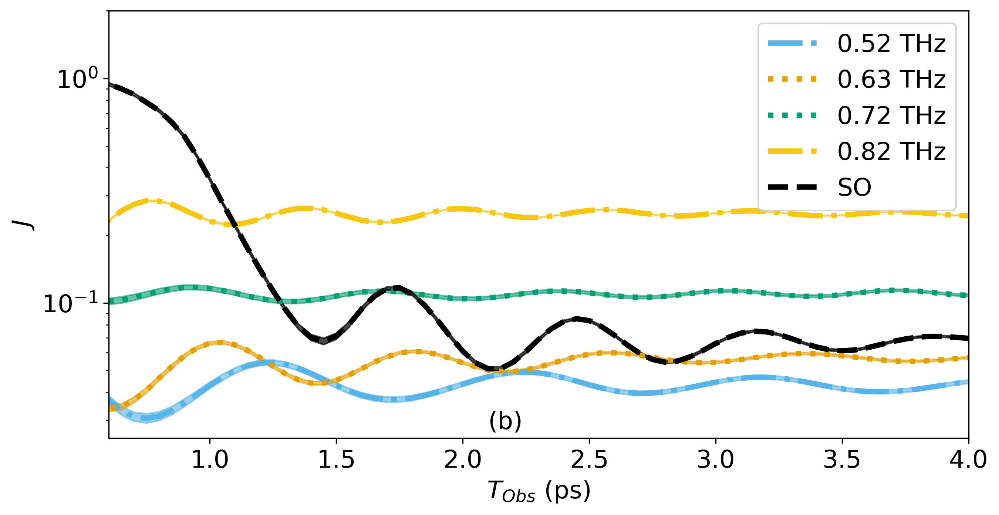

In [26]:
#plt.fill_betweenx([0, 2], 0, tObs[2], color=ok['black'], label='Err from machine precision', alpha=0.5)

plt.figure(figsize=(10,5))
plt.fill_between(tObs, np.array(source_J_avg[0]) - np.array(err05), 
                 np.array(source_J_avg[0]) + np.array(err05),  color=ok['blue'], alpha=0.6)
plt.fill_between(tObs, np.array(source_J_avg[1]) - np.array(err06), 
                 np.array(source_J_avg[1]) + np.array(err06), color=ok['orange'], alpha=0.6)
plt.fill_between(tObs, np.array(source_J_avg[2]) - np.array(err07), 
                 np.array(source_J_avg[2]) + np.array(err07), color=ok['green'], alpha=0.6)
plt.fill_between(tObs, np.array(source_J_avg[3]) - np.array(err08), 
                 np.array(source_J_avg[3]) + np.array(err08), color=ok['amber'], alpha=0.6)

plt.fill_between(tObs, np.array(SO_J_avg) - np.array(errSO), 
                 np.array(SO_J_avg) + np.array(errSO), color=ok['black'], alpha=0.7)

#plt.axvline(0.6, color=ok['purple'], label='$T_{Obs} = T_{SO}$')

plt.semilogy(tObs, source_J_avg[0], label='0.52 THz', color=ok['blue'], linestyle='-.')
plt.semilogy(tObs, source_J_avg[1], label='0.63 THz', color=ok['orange'], linestyle=':')
plt.semilogy(tObs, source_J_avg[2], label='0.72 THz', color=ok['green'], linestyle=':')
plt.semilogy(tObs, source_J_avg[3], label='0.82 THz', color=ok['amber'], linestyle='-.')

plt.semilogy(tObs, SO_J_avg, label='SO', color=ok['black'], linestyle='--')

plt.subplot().text(2.1, 0.0275, '(b)', fontsize=16)

plt.xlim(0.6, 4)
plt.ylim(0.025, 2)
plt.xlabel('$T_{Obs}$ (ps)')
plt.ylabel('$J$')
plt.legend(loc='upper right')
plt.savefig('./Plots/Paper/J_with_error.pdf')
plt.show()

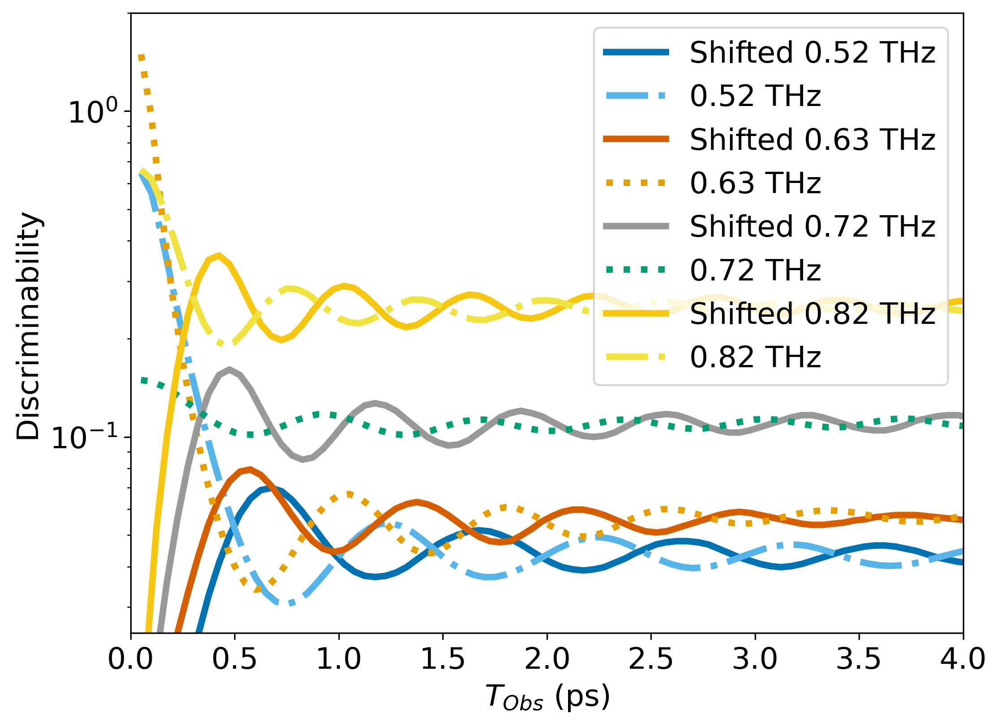

In [27]:
plt.semilogy(f5b[h5b[4]].T[0] * 0.5, (10 ** f5b[h5b[4]]).T[1], label='Shifted ' + h5b[4], color=ok['navy'])
plt.semilogy(tObs, source_J_avg[0], label='0.52 THz', color=ok['blue'], linestyle='-.')

plt.semilogy(f5b[h5b[3]].T[0] * 0.5, (10 ** f5b[h5b[3]]).T[1], label='Shifted ' + h5b[3], color=ok['red'])
plt.semilogy(tObs, source_J_avg[1], label='0.63 THz', color=ok['orange'], linestyle=':')


plt.semilogy(f5b[h5b[2]].T[0] * 0.5, (10 ** f5b[h5b[2]]).T[1], label='Shifted ' + h5b[2], color=ok['grey'])
plt.semilogy(tObs, source_J_avg[2], label='0.72 THz', color=ok['green'], linestyle=':')

plt.semilogy(f5b[h5b[1]].T[0] * 0.5, (10 ** f5b[h5b[1]]).T[1], label='Shifted ' + h5b[1], color=ok['amber'])
plt.semilogy(tObs, source_J_avg[3], label='0.82 THz', color=ok['yellow'], linestyle='-.')



plt.xlim(0, 4)
plt.ylim(0.025, 2)
plt.xlabel('$T_{Obs}$ (ps)')
plt.ylabel('Discriminability')
plt.legend(loc='upper right')

#  Follow Up Paper Plotting

In [28]:
@dataclass
class Pulse:
    time: np.ndarray
    field: np.ndarray
    _individual_fields: np.ndarray = None
    peaks_time: np.ndarray = None
    time_range: np.ndarray = None
    half_period: float = 0
    interp_field: InterpolatedUnivariateSpline = None
    err_lower_bound: InterpolatedUnivariateSpline = None
    err_upper_bound: InterpolatedUnivariateSpline = None

In [29]:
folder_data = "OptimizedJData"
def load_experimental_so(file_template, max_ampl=1):
    
    # load file names matching the pattern
    filenames = sorted(glob.glob(folder_data + file_template))

    if len(filenames) == 0:
        # Nothing to load
        return
    
    all_data = [np.loadtxt(_).T[:-1] for _ in filenames]
    
    times, _individual_fields = zip(*all_data)
    
    _individual_fields = np.array(_individual_fields)
    
    time = times[0]
    
    # check that time is time
    assert np.all(np.diff(time) > 0), "`time` is probably not time"

    #  Checking whether the time axis coincide
    assert all(np.allclose(time, _) for _ in times), \
        "This workbook cannot be used since the time data is not syncronized"
    
    field = np.mean(_individual_fields, axis=0)
    
    # Substract the mean from experimental fields to compensate for parasitic offset
    field -= field.mean()
    
    confidence_level=0.95
    # calculate the confidence interval
    err_lower_bound, err_upper_bound = stats.t.interval(
        confidence_level, 
        _individual_fields.shape[0], 
        field, 
        stats.sem(_individual_fields, axis=0)
    )
    
    # Saving the data 
    return Pulse(
        time = time, 
        field = field / max_ampl,
        _individual_fields = _individual_fields,
        err_lower_bound = err_lower_bound / max_ampl,
        err_upper_bound = err_upper_bound / max_ampl,
    )

def get_lf_stft(x, t, pad=2):
    step = np.abs(t[1] - t[0])
    nFFT = int(2 ** (np.ceil(np.log(len(t))) + pad))
    f_step = 1 / step
    x -= np.average(x)
    f_stft, t_stft, zxx = stft(x, f_step, nperseg=len(x)/2, 
                               noverlap=len(x)/2-1, window=('gaussian', 14), nfft = nFFT)
    nrow, ncol = np.shape(zxx)
    ampl= np.abs(zxx)
    f_avg = np.zeros(ncol)
    for _ in range(ncol):
        ampl_sum = np.sum(ampl[:,_])
        f_avg[_] = np.sum(f_stft * ampl[:,_])/ampl_sum
    return f_avg, t_stft


In [30]:
#Load the SO fields first for normalization
Glucose_SO = load_experimental_so('/Glucose_SO_*.dat')
LGA_SO = load_experimental_so('/LGA_SO_*.dat')

# Get the max Amplitude for normalization
max_ampl = max(Glucose_SO.field.max(), LGA_SO.field.max())

# Normalize the fields you've already loaded
Glucose_SO.field /= max_ampl
Glucose_SO.err_lower_bound /= max_ampl
Glucose_SO.err_upper_bound /= max_ampl

LGA_SO.field /= max_ampl
LGA_SO.err_lower_bound /= max_ampl
LGA_SO.err_upper_bound /= max_ampl

# Get the source harmonics with the normalization from the superoscillating fields
Glu_SO_5 = load_experimental_so('/Glucose_so_F05_*.dat', max_ampl)
Glu_SO_6 = load_experimental_so('/Glucose_so_F06_*.dat', max_ampl)
Glu_SO_7 = load_experimental_so('/Glucose_so_F07_*.dat', max_ampl)
Glu_SO_8 = load_experimental_so('/Glucose_so_F08_*.dat', max_ampl)
LGA_SO_5 = load_experimental_so('/LGA_so_F05_*.dat', max_ampl)
LGA_SO_6 = load_experimental_so('/LGA_so_F06_*.dat', max_ampl)
LGA_SO_7 = load_experimental_so('/LGA_so_F07_*.dat', max_ampl)
LGA_SO_8 = load_experimental_so('/LGA_so_F08_*.dat', max_ampl)

In [31]:
# Verify the times are correct accross the two arrays
print([np.count_nonzero(Glucose_SO.time != LGA_SO.time), 
       np.count_nonzero(Glucose_SO.time != Glu_SO_5.time),
       np.count_nonzero(Glu_SO_5.time != Glu_SO_6.time),
       np.count_nonzero(Glu_SO_6.time != Glu_SO_7.time),
       np.count_nonzero(Glu_SO_7.time != Glu_SO_8.time),])

# Center the time about 0
center_t = Glucose_SO.time[int(len(Glucose_SO.time)/2)]
print(center_t)
times  = Glucose_SO.time - center_t


[0, 0, 0, 0, 0]
26.0


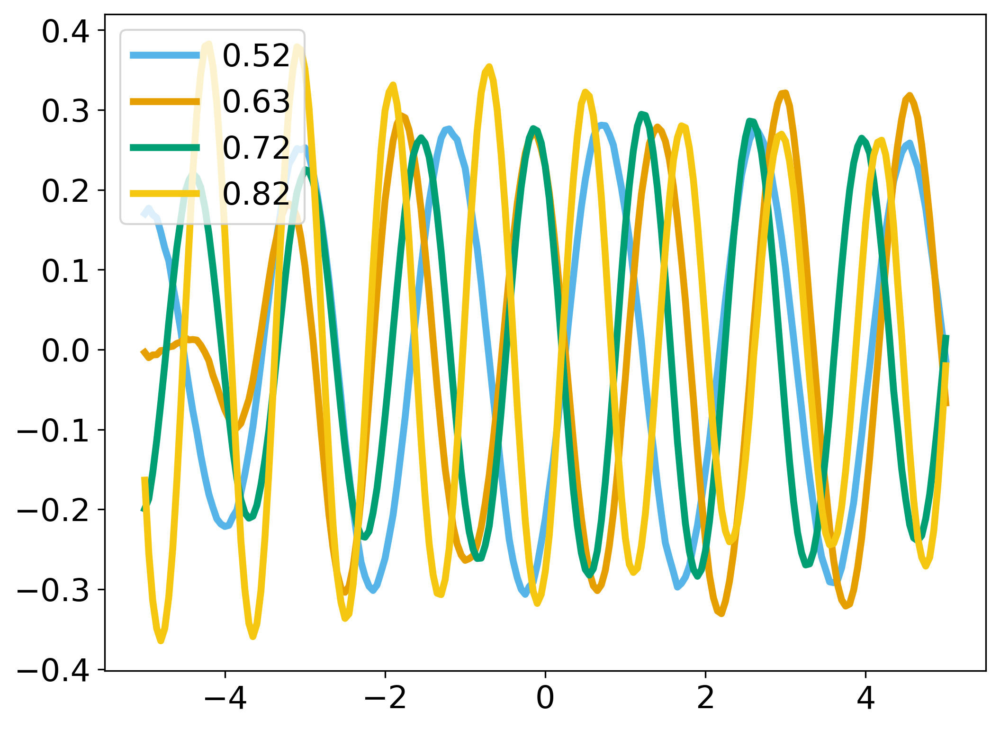

In [32]:

#Plot the individual harmonics, make sure nothing is amiss
plt.figure()
plt.plot(times, Glu_SO_5.field, label='0.52')
plt.plot(times, Glu_SO_6.field, label='0.63')
plt.plot(times, Glu_SO_7.field, label='0.72')
plt.plot(times, Glu_SO_8.field, label='0.82')

plt.legend()

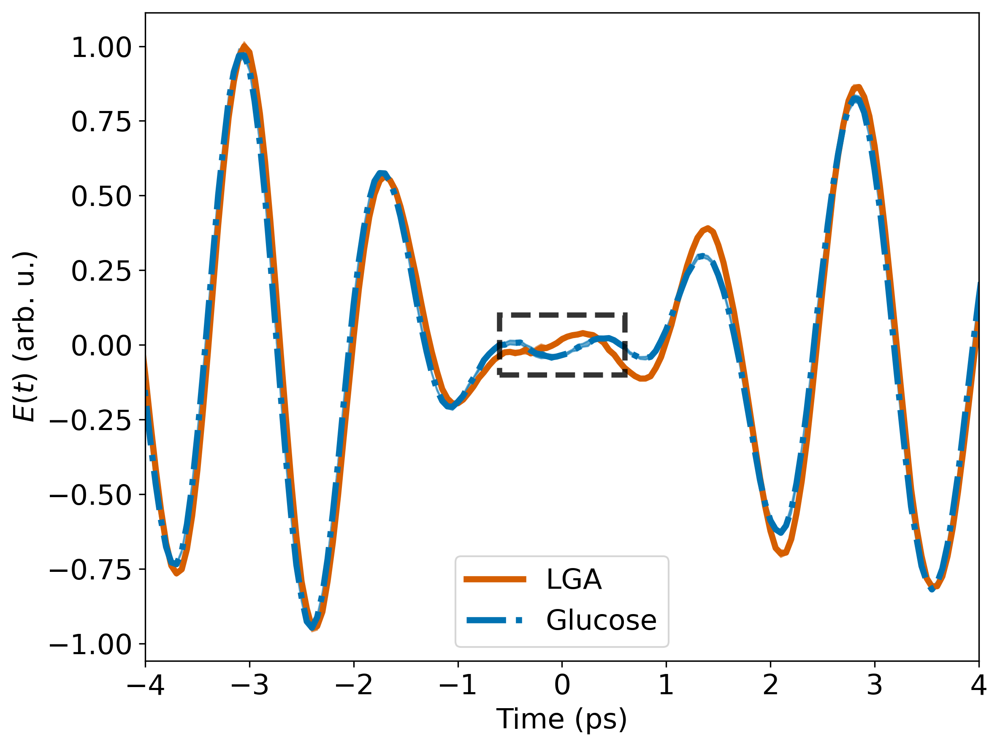

In [33]:
plt.figure()
plt.fill_between(times,  LGA_SO.err_lower_bound, LGA_SO.err_upper_bound, color=ok['red'], alpha=0.6)
plt.plot(times, LGA_SO.field, color = ok['red'], label='LGA')

plt.fill_between(times,  Glucose_SO.err_lower_bound, Glucose_SO.err_upper_bound, color=ok['navy'], alpha=0.6)
plt.plot(times, Glucose_SO.field, color = ok['navy'], linestyle='-.', label='Glucose')

plt.subplot().add_patch(
    patches.Rectangle((-0.6, -.1), 1.2, 0.2, linestyle='--', linewidth=3, edgecolor=ok['black'], 
                      facecolor='none', alpha=0.8, zorder=3))

plt.xlim(-4, 4)
plt.xlabel('Time (ps)')
plt.ylabel('$E(t)$ (arb. u.)')
plt.legend(loc='lower center')
plt.tight_layout()
plt.savefig('./Plots/PRA_Paper/Fields_wError.pdf')
plt.show()

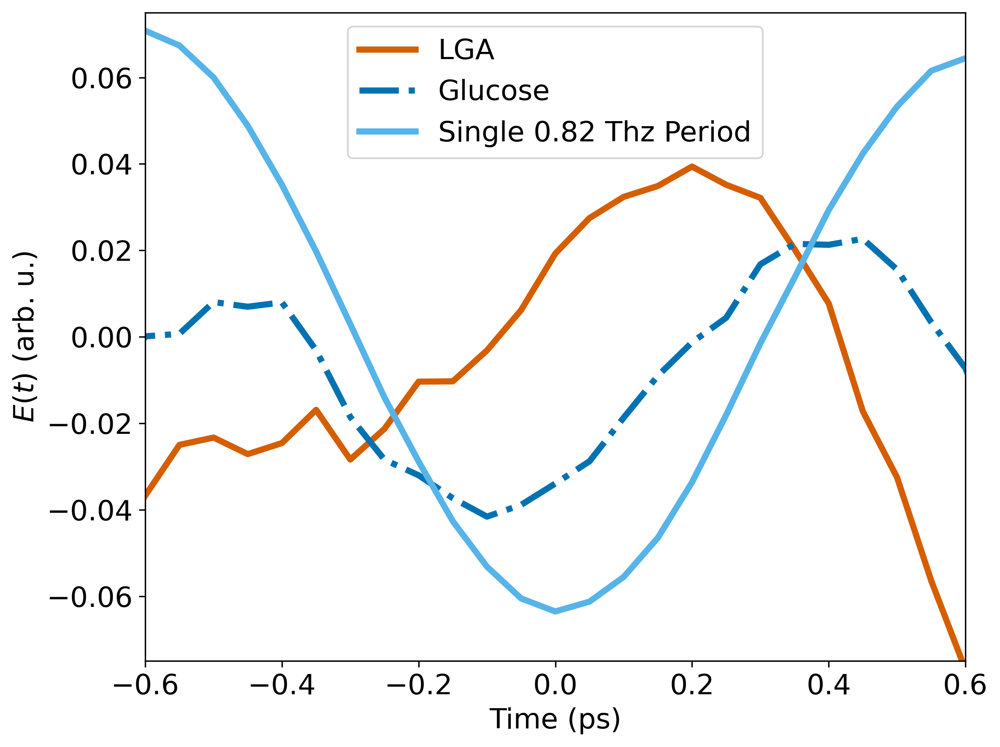

In [34]:
plt.figure()
#plt.fill_between(times,  LGA_SO.err_lower_bound, LGA_SO.err_upper_bound, color=ok['red'], alpha=0.6)
plt.plot(times, LGA_SO.field, color = ok['red'], label='LGA')

#plt.fill_between(times,  Glucose_SO.err_lower_bound, Glucose_SO.err_upper_bound, color=ok['navy'], alpha=0.6)
plt.plot(times, Glucose_SO.field, color = ok['navy'], linestyle='-.', label='Glucose')

plt.plot(np.array(times)+0.1, 0.2*Glu_SO_8.field, color=ok['blue'], label='Single 0.82 Thz Period')
plt.xlim(-0.6, 0.6)
plt.ylim(-0.075, 0.075)
plt.xlabel('Time (ps)')
plt.ylabel('$E(t)$ (arb. u.)')
plt.legend(loc='upper center')
plt.tight_layout()
plt.savefig('./Plots/PRA_Paper/SO_Region.pdf')
plt.show()

In [35]:
# Get the Local Frequencies
Glu_lf_amp, Glu_lf_t = get_lf_stft(Glucose_SO.field, times)
LGA_lf_amp, LGA_lf_t = get_lf_stft(LGA_SO.field, times)

# Get the Local Frequencies of the constituent pulses
Glu_lf_08_amp, Glu_lf_08_t = get_lf_stft(Glu_SO_8.field, times)
Glu_lf_07_amp, Glu_lf_07_t = get_lf_stft(Glu_SO_7.field, times)
Glu_lf_06_amp, Glu_lf_06_t = get_lf_stft(Glu_SO_6.field, times)
Glu_lf_05_amp, Glu_lf_05_t = get_lf_stft(Glu_SO_5.field, times)

LGA_lf_08_amp, LGA_lf_08_t = get_lf_stft(LGA_SO_8.field, times)
LGA_lf_07_amp, LGA_lf_07_t = get_lf_stft(LGA_SO_7.field, times)
LGA_lf_06_amp, LGA_lf_06_t = get_lf_stft(LGA_SO_6.field, times)
LGA_lf_05_amp, LGA_lf_05_t = get_lf_stft(LGA_SO_5.field, times)

# Recenter the time window
Glu_lf_t = np.array(Glu_lf_t) - 0.5 * Glu_lf_t[-1]
LGA_lf_t = np.array(LGA_lf_t) - 0.5 * LGA_lf_t[-1]
Glu_lf_08_t = np.array(Glu_lf_08_t) - 0.5 * Glu_lf_08_t[-1]
LGA_lf_08_t = np.array(LGA_lf_08_t) - 0.5 * LGA_lf_08_t[-1]
Glu_lf_07_t = np.array(Glu_lf_07_t) - 0.5 * Glu_lf_07_t[-1]
LGA_lf_07_t = np.array(LGA_lf_07_t) - 0.5 * LGA_lf_07_t[-1]
Glu_lf_06_t = np.array(Glu_lf_06_t) - 0.5 * Glu_lf_06_t[-1]
LGA_lf_06_t = np.array(LGA_lf_06_t) - 0.5 * LGA_lf_06_t[-1]
Glu_lf_05_t = np.array(Glu_lf_05_t) - 0.5 * Glu_lf_05_t[-1]
LGA_lf_05_t = np.array(LGA_lf_05_t) - 0.5 * LGA_lf_05_t[-1]

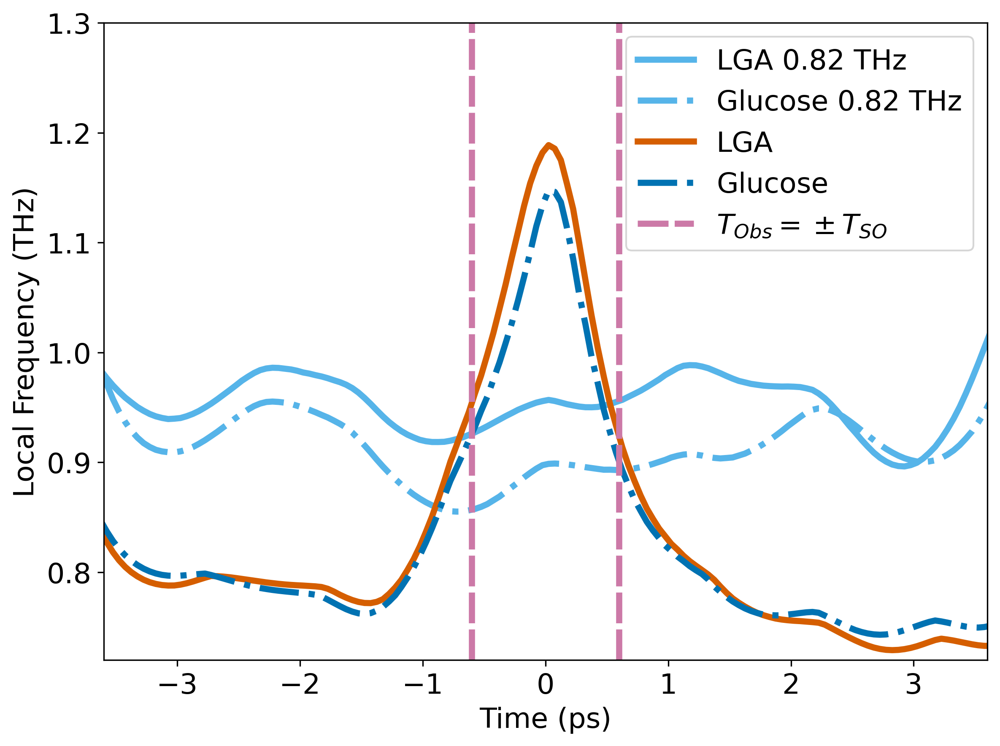

In [59]:
# Plot the Local Frequencies
plt.figure()
# Start with the constituent fields
plt.plot(LGA_lf_08_t, LGA_lf_08_amp, color=ok['blue'], label='LGA 0.82 THz')
plt.plot(Glu_lf_08_t, Glu_lf_08_amp, color=ok['blue'], linestyle='-.', label='Glucose 0.82 THz')
#plt.plot(LGA_lf_07_t, LGA_lf_07_amp, color=ok['orange'], label='LGA 0.72 THz')
#plt.plot(Glu_lf_07_t, Glu_lf_07_amp, color=ok['orange'], linestyle='-.', label='Glucose 0.72 THz')
#plt.plot(LGA_lf_06_t, LGA_lf_06_amp, label='LGA 0.63 THz')
#plt.plot(Glu_lf_06_t, Glu_lf_06_amp, linestyle='-.', label='Glucose 0.63 THz')
#plt.plot(LGA_lf_05_t, LGA_lf_05_amp, label='LGA 0.52 THz')
#plt.plot(Glu_lf_05_t, Glu_lf_05_amp, linestyle='-.', label='Glucose 0.52 THz')

# Plot the superoscillation local frequencies on top
plt.plot(LGA_lf_t, LGA_lf_amp, color=ok['red'], label='LGA')
plt.plot(Glu_lf_t, Glu_lf_amp, color=ok['navy'], linestyle='-.', label='Glucose')

plt.axvline(0.6, color=ok['purple'], linestyle=(0, (5, 1)), label='$T_{Obs} = \pm T_{SO}$')
plt.axvline(-0.6, color=ok['purple'], linestyle=(0, (5, 1)))

plt.xlim(-3.6, 3.6)
plt.ylim(0.72, 1.3)
plt.xlabel('Time (ps)')
plt.ylabel('Local Frequency (THz)')
plt.legend()
plt.tight_layout()
plt.savefig('./Plots/PRA_Paper/Local_Freq_with08.pdf')
plt.show()

In [37]:
# Now get the discriminability
new_source_J = np.empty(shape=(4, 5)+(0,)).tolist()
new_SO_J = [[], [], [], [], []]
new_tObs = []
SO_J = []
SO_5_J = []
SO_6_J = []
SO_7_J = []
SO_8_J = []

new_source_J_avg = [[], [], [], []]
new_SO_J_avg = []


ub = int(len(times)/2)           
for _ in range(ub):
    wedge = slice((ub- _ - 1), (ub + _ + 1)) # len(source_times) - _)
    new_tObs.append(times[ub + _ + 1])
    SO_J.append(get_j(Glucose_SO.field, LGA_SO.field, times, wedge))
    SO_5_J.append(get_j(Glu_SO_5.field, LGA_SO_5.field, times, wedge))
    SO_6_J.append(get_j(Glu_SO_6.field, LGA_SO_6.field, times, wedge))
    SO_7_J.append(get_j(Glu_SO_7.field, LGA_SO_7.field, times, wedge))
    SO_8_J.append(get_j(Glu_SO_8.field, LGA_SO_8.field, times, wedge))
    for i in range(len(Glu_SO_5._individual_fields)):
        # Here we calculate J for each field, and then we average
        # This will give us some idea of the error
        new_SO_J[i].append(get_j(glu_amps[i], lga_amps[i], source_times, wedge))
        new_source_J[0][i].append(get_j(Glu_SO_5._individual_fields[i], LGA_SO_5._individual_fields[i], 
                                  times, wedge))
        new_source_J[1][i].append(get_j(Glu_SO_6._individual_fields[i], LGA_SO_6._individual_fields[i], 
                                  times, wedge))
        new_source_J[2][i].append(get_j(Glu_SO_7._individual_fields[i], LGA_SO_7._individual_fields[i], 
                                  times, wedge))
        new_source_J[3][i].append(get_j(Glu_SO_8._individual_fields[i], LGA_SO_8._individual_fields[i], 
                                  times, wedge))
            
new_avg05 = np.average(new_source_J[0], axis=0)
new_avg06 = np.average(new_source_J[1], axis=0)
new_avg07 = np.average(new_source_J[2], axis=0)
new_avg08 = np.average(new_source_J[3], axis=0)

new_avgSO = np.average(new_SO_J, axis=0)

In [38]:
# Because the error in load_experimental_so gives upper and lower bounds, we need to get the δ error here
δGlu_SO = (Glucose_SO.err_upper_bound - Glucose_SO.err_lower_bound)/2
δLGA_SO = (LGA_SO.err_upper_bound - LGA_SO.err_lower_bound)/2

δGlu_SO_5 = (Glu_SO_5.err_upper_bound - Glu_SO_5.err_lower_bound)/2
δGlu_SO_6 = (Glu_SO_6.err_upper_bound - Glu_SO_6.err_lower_bound)/2
δGlu_SO_7 = (Glu_SO_7.err_upper_bound - Glu_SO_7.err_lower_bound)/2
δGlu_SO_8 = (Glu_SO_8.err_upper_bound - Glu_SO_8.err_lower_bound)/2

δLGA_SO_5 = (LGA_SO_5.err_upper_bound - LGA_SO_5.err_lower_bound)/2
δLGA_SO_6 = (LGA_SO_6.err_upper_bound - LGA_SO_6.err_lower_bound)/2
δLGA_SO_7 = (LGA_SO_7.err_upper_bound - LGA_SO_7.err_lower_bound)/2
δLGA_SO_8 = (LGA_SO_8.err_upper_bound - LGA_SO_8.err_lower_bound)/2

# Now we calculate the error
err_SO =[]
err_5 = []
err_6 = []
err_7 = []
err_8 = []

for _ in range(ub):
    wedge = slice((ub - _ - 1), (ub + _ + 1))
    err_5.append(get_J_error(Glu_SO_5.field, LGA_SO_5.field, δGlu_SO_5, δLGA_SO_5, wedge))
    err_6.append(get_J_error(Glu_SO_6.field, LGA_SO_6.field, δGlu_SO_6, δLGA_SO_6, wedge))
    err_7.append(get_J_error(Glu_SO_7.field, LGA_SO_7.field, δGlu_SO_7, δLGA_SO_7, wedge))
    err_8.append(get_J_error(Glu_SO_8.field, LGA_SO_8.field, δGlu_SO_8, δLGA_SO_8, wedge))

    err_SO.append(get_J_error(Glucose_SO.field, LGA_SO.field, δGlu_SO, δLGA_SO, wedge))

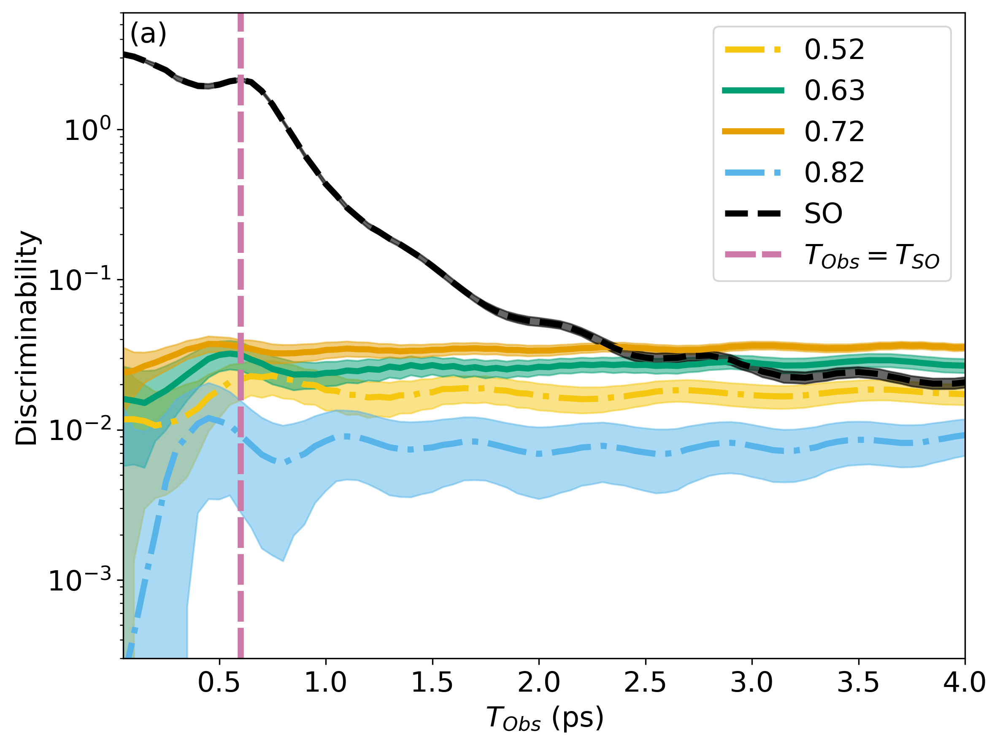

In [81]:
plt.figure()

plt.fill_between(new_tObs, np.array(SO_5_J) - np.array(err_5), np.array(SO_5_J) + np.array(err_5), 
                 color=ok['amber'], alpha=0.5)
plt.fill_between(new_tObs, np.array(SO_6_J) - np.array(err_6), np.array(SO_6_J) + np.array(err_6), 
                 color=ok['green'], alpha=0.5)
plt.fill_between(new_tObs, np.array(SO_7_J) - np.array(err_7), np.array(SO_7_J) + np.array(err_7), 
                 color=ok['orange'], alpha=0.5)
plt.fill_between(new_tObs, np.array(SO_8_J) - np.array(err_8), np.array(SO_8_J) + np.array(err_8), 
                 color=ok['blue'], alpha=0.5)

plt.fill_between(new_tObs, np.array(SO_J) - np.array(err_SO), np.array(SO_J) + np.array(err_SO), 
                 color=ok['black'], alpha=0.6)

plt.semilogy(new_tObs, SO_5_J, label='0.52', color=ok['amber'], linestyle= '-.')
plt.semilogy(new_tObs, SO_6_J, label='0.63', color=ok['green'])
plt.semilogy(new_tObs, SO_7_J, label='0.72', color=ok['orange'])
plt.semilogy(new_tObs, SO_8_J, label='0.82', color=ok['blue'], linestyle= '-.')

plt.semilogy(new_tObs, SO_J, label='SO', linestyle='--', color=ok['black'])

plt.axvline(0.6, color=ok['purple'], linestyle=(0, (5, 1)), label='$T_{Obs} = T_{SO}$')

plt.subplot().text(0.075, 3.8, '(a)', fontsize=16)

plt.xlim(0.05, 4)
plt.ylim(3e-4, 6)
plt.xlabel('$T_{Obs}$ (ps)')
plt.ylabel('Discriminability')
plt.legend()
plt.tight_layout()
plt.savefig('./Plots/PRA_Paper/Discriminability_wError.pdf')

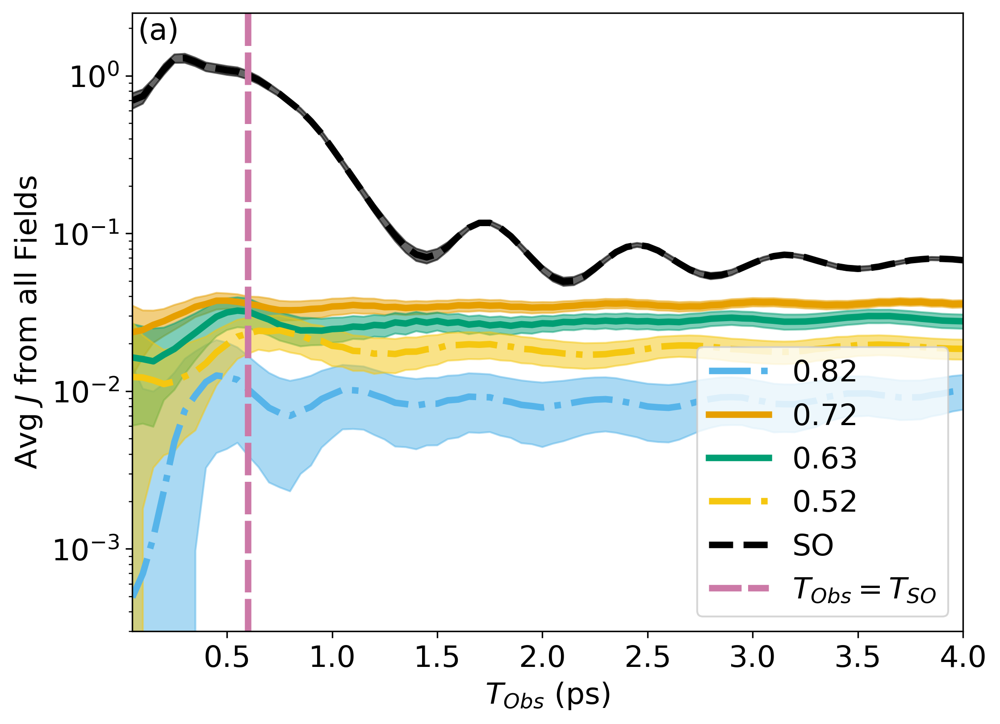

In [78]:
plt.fill_between(new_tObs, np.array(new_avg08) - np.array(err_8), np.array(new_avg08) + np.array(err_8), 
                 color=ok['blue'], alpha=0.5)
plt.fill_between(new_tObs, np.array(new_avg07) - np.array(err_7), np.array(new_avg07) + np.array(err_7), 
                 color=ok['orange'], alpha=0.5)
plt.fill_between(new_tObs, np.array(new_avg06) - np.array(err_6), np.array(new_avg06) + np.array(err_6), 
                 color=ok['green'], alpha=0.5)
plt.fill_between(new_tObs, np.array(new_avg05) - np.array(err_5), np.array(new_avg05) + np.array(err_5), 
                 color=ok['amber'], alpha=0.5)


plt.fill_between(new_tObs, np.array(new_avgSO) - np.array(err_SO), np.array(new_avgSO) + np.array(err_SO), 
                 color=ok['black'], alpha=0.6)


plt.semilogy(new_tObs, new_avg08, label='0.82', linestyle='-.')
plt.semilogy(new_tObs, new_avg07, label='0.72')
plt.semilogy(new_tObs, new_avg06, label='0.63')
plt.semilogy(new_tObs, new_avg05, label='0.52', linestyle='-.')

plt.semilogy(new_tObs, new_avgSO, linestyle='--', label='SO', color=ok['black'])

plt.axvline(0.6, color=ok['purple'], linestyle=(0, (5, 1)), label='$T_{Obs} = T_{SO}$')

plt.subplot().text(0.075, 1.7, '(a)', fontsize=16)

plt.xlim(0.05, 4)
plt.ylim(3e-4, 2.5)
plt.xlabel('$T_{Obs}$ (ps)')
plt.ylabel('Avg $J$ from all Fields')
plt.legend(loc='lower right')

In [41]:
obs_width = int(np.ceil(1.2/np.abs(times[0]-times[1])))

center_times = []
SO_window, SO_5_window, SO_6_window, SO_7_window, SO_8_window = ([] for _ in range(5))

for _ in range(len(times)-obs_width):
    center_times.append(times[_+int(obs_width * 0.5)])
    fixed_wedge = slice(_, (_ + obs_width))
    SO_window.append(get_j(Glucose_SO.field, LGA_SO.field, times, fixed_wedge))
    SO_5_window.append(get_j(Glu_SO_5.field, LGA_SO_5.field, times, fixed_wedge))
    SO_6_window.append(get_j(Glu_SO_6.field, LGA_SO_6.field, times, fixed_wedge))
    SO_7_window.append(get_j(Glu_SO_7.field, LGA_SO_7.field, times, fixed_wedge))
    SO_8_window.append(get_j(Glu_SO_8.field, LGA_SO_8.field, times, fixed_wedge))
    
# Because the error in load_experimental_so gives upper and lower bounds, we need to get the δ error here
δGlu_SO = (Glucose_SO.err_upper_bound - Glucose_SO.err_lower_bound)/2
δLGA_SO = (LGA_SO.err_upper_bound - LGA_SO.err_lower_bound)/2

δGlu_SO_5 = (Glu_SO_5.err_upper_bound - Glu_SO_5.err_lower_bound)/2
δGlu_SO_6 = (Glu_SO_6.err_upper_bound - Glu_SO_6.err_lower_bound)/2
δGlu_SO_7 = (Glu_SO_7.err_upper_bound - Glu_SO_7.err_lower_bound)/2
δGlu_SO_8 = (Glu_SO_8.err_upper_bound - Glu_SO_8.err_lower_bound)/2

δLGA_SO_5 = (LGA_SO_5.err_upper_bound - LGA_SO_5.err_lower_bound)/2
δLGA_SO_6 = (LGA_SO_6.err_upper_bound - LGA_SO_6.err_lower_bound)/2
δLGA_SO_7 = (LGA_SO_7.err_upper_bound - LGA_SO_7.err_lower_bound)/2
δLGA_SO_8 = (LGA_SO_8.err_upper_bound - LGA_SO_8.err_lower_bound)/2

# Now we calculate the error
err_SO_window =[]
err_5_window = []
err_6_window = []
err_7_window = []
err_8_window = []

for _ in range(len(times)-obs_width):
    fixed_wedge = slice(_, (_ + obs_width))
    err_5_window.append(get_J_error(Glu_SO_5.field, LGA_SO_5.field, δGlu_SO_5, δLGA_SO_5, fixed_wedge))
    err_6_window.append(get_J_error(Glu_SO_6.field, LGA_SO_6.field, δGlu_SO_6, δLGA_SO_6, fixed_wedge))
    err_7_window.append(get_J_error(Glu_SO_7.field, LGA_SO_7.field, δGlu_SO_7, δLGA_SO_7, fixed_wedge))
    err_8_window.append(get_J_error(Glu_SO_8.field, LGA_SO_8.field, δGlu_SO_8, δLGA_SO_8, fixed_wedge))

    err_SO_window.append(get_J_error(Glucose_SO.field, LGA_SO.field, δGlu_SO, δLGA_SO, fixed_wedge))

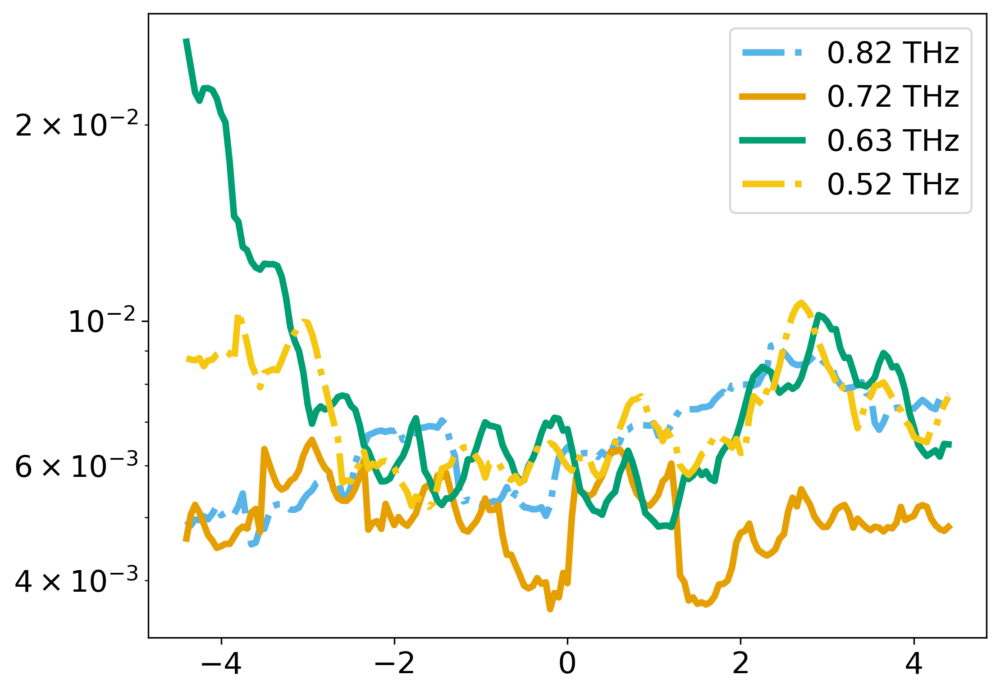

In [42]:
plt.figure()
plt.semilogy(center_times, err_8_window, label='0.82 THz', linestyle='-.')
plt.semilogy(center_times, err_7_window, label='0.72 THz')
plt.semilogy(center_times, err_6_window, label='0.63 THz')
plt.semilogy(center_times, err_5_window, label='0.52 THz', linestyle='-.')

plt.legend()
plt.show()

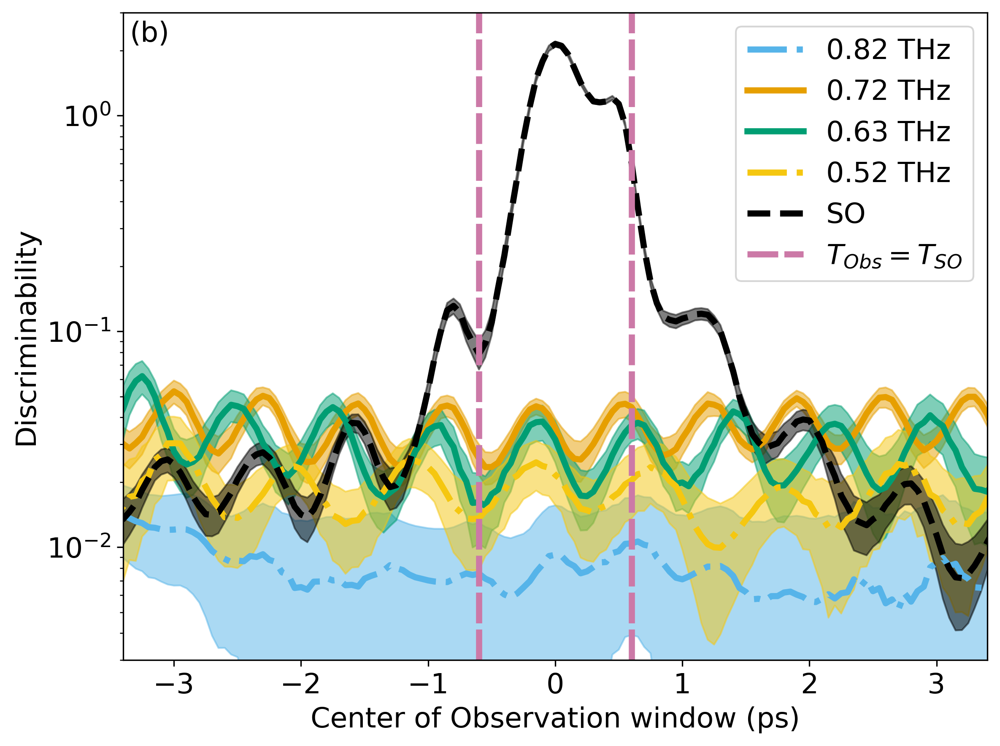

In [80]:
plt.figure()

plt.fill_between(center_times, np.array(SO_8_window) - np.array(err_8_window), 
                 np.array(SO_8_window) + np.array(err_8_window), color=ok['blue'], alpha=0.5)
plt.fill_between(center_times, np.array(SO_7_window) - np.array(err_7_window), 
                 np.array(SO_7_window) + np.array(err_7_window), color=ok['orange'], alpha=0.5)
plt.fill_between(center_times, np.array(SO_6_window) - np.array(err_6_window), 
                 np.array(SO_6_window) + np.array(err_6_window), color=ok['green'], alpha=0.5)
plt.fill_between(center_times, np.array(SO_5_window) - np.array(err_5_window), 
                 np.array(SO_5_window) + np.array(err_5_window), color=ok['amber'], alpha=0.5)

plt.fill_between(center_times, np.array(SO_window) - np.array(err_SO_window), 
                 np.array(SO_window) + np.array(err_SO_window), color=ok['black'], alpha=0.5)

plt.semilogy(center_times, SO_8_window, label='0.82 THz', linestyle='-.')
plt.semilogy(center_times, SO_7_window, label='0.72 THz')
plt.semilogy(center_times, SO_6_window, label='0.63 THz')
plt.semilogy(center_times, SO_5_window, label='0.52 THz', linestyle='-.')

plt.semilogy(center_times, SO_window, linestyle='--', color=ok['black'], label='SO')

plt.axvline(0.6, color=ok['purple'], linestyle=(0, (5, 1)), label='$T_{Obs} = T_{SO}$')
plt.axvline(-0.6, color=ok['purple'], linestyle=(0, (5, 1)))

plt.subplot().text(-3.35, 2.2, '(b)', fontsize=16)


plt.xlim(0.05, 4)
plt.ylim(3e-4, 2.5)
plt.xlim(-3.4, 3.4)
plt.ylim(0.003, 3)
plt.xlabel('Center of Observation window (ps)')
plt.ylabel('Discriminability')
plt.legend()
plt.tight_layout()
plt.savefig('./Plots/PRA_Paper/Discriminability_Window.pdf')
plt.show()

# Plotting for the Theoretical Section

/home/dustin/anaconda3/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1340: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


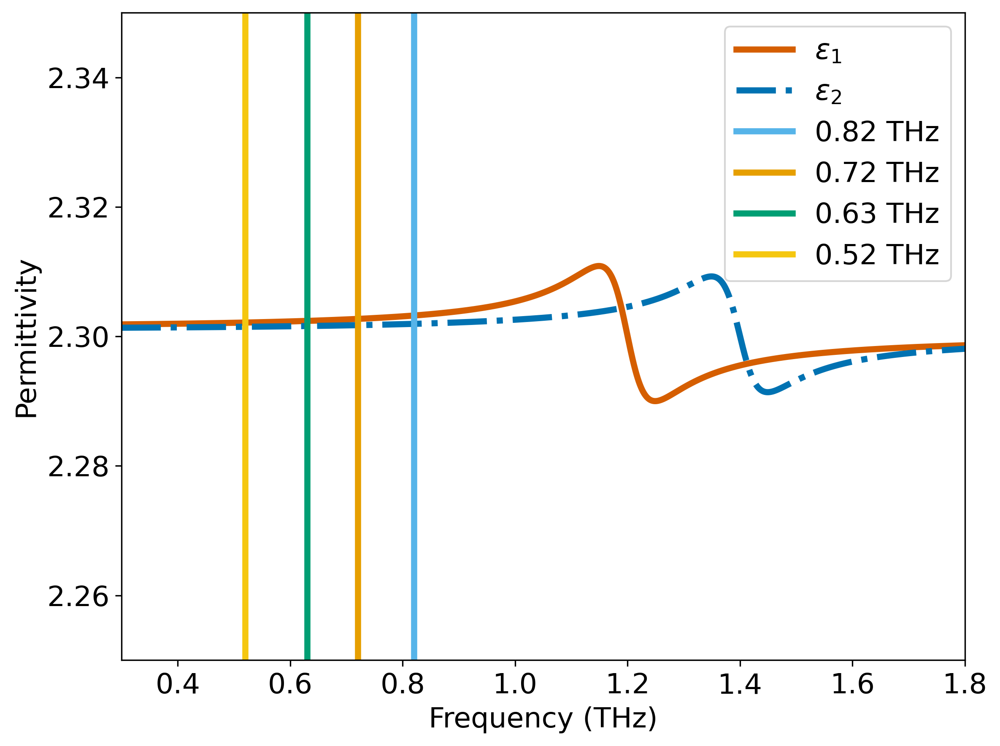

In [86]:
# Calculate the theoretical permitivities

def get_permit(ω, ω_0):
    return 2.3 + (0.05 ** 2) / (ω_0 ** 2 - ω ** 2 - 1j * 0.1 * ω)
    
ω_list = np.linspace(0.05, 2.0, 3000)
ϵ1 = get_permit(ω_list, ω_0=1.2)
ϵ2 = get_permit(ω_list, ω_0=1.4)

plt.plot(ω_list, ϵ1, color=ok['red'], label='$\epsilon_1$')
plt.plot(ω_list, ϵ2, color=ok['navy'], label='$\epsilon_2$', linestyle='-.')

plt.axvline(0.82, label='0.82 THz', color=ok['blue'])
plt.axvline(0.72, label='0.72 THz', color=ok['orange'])
plt.axvline(0.63, label='0.63 THz', color=ok['green'])
plt.axvline(0.52, label='0.52 THz', color=ok['amber'])

plt.legend(loc='upper right')
plt.xlim(0.3, 1.8)
plt.ylim(2.25, 2.35)
plt.xlabel('Frequency (THz)')
plt.ylabel('Permittivity')
plt.tight_layout()
plt.savefig('./Plots/PRA_Paper/THeory_permittivity.pdf')
plt.show()


In [45]:
# This is just loading the data sent from the optimization
f1 = np.load('./Data/Paper/Fig.1.npz')
f2a = np.load('./Data/Paper/Fig.2(a).npz')
f2b = np.load('./Data/Paper/Fig.2(b).npz')
f3 = np.load('./Data/Paper/Fig.3.npz')
f4a = np.load('./Data/Paper/Fig.4(a).npz')
f4b = np.load('./Data/Paper/Fig.4(b).npz')
f5a = np.load('./Data/Paper/Fig.5(a).npz')
f5b = np.load('./Data/Paper/Fig.5(b).npz')
f5c = np.load('./Data/Paper/Fig.5(c).npz')

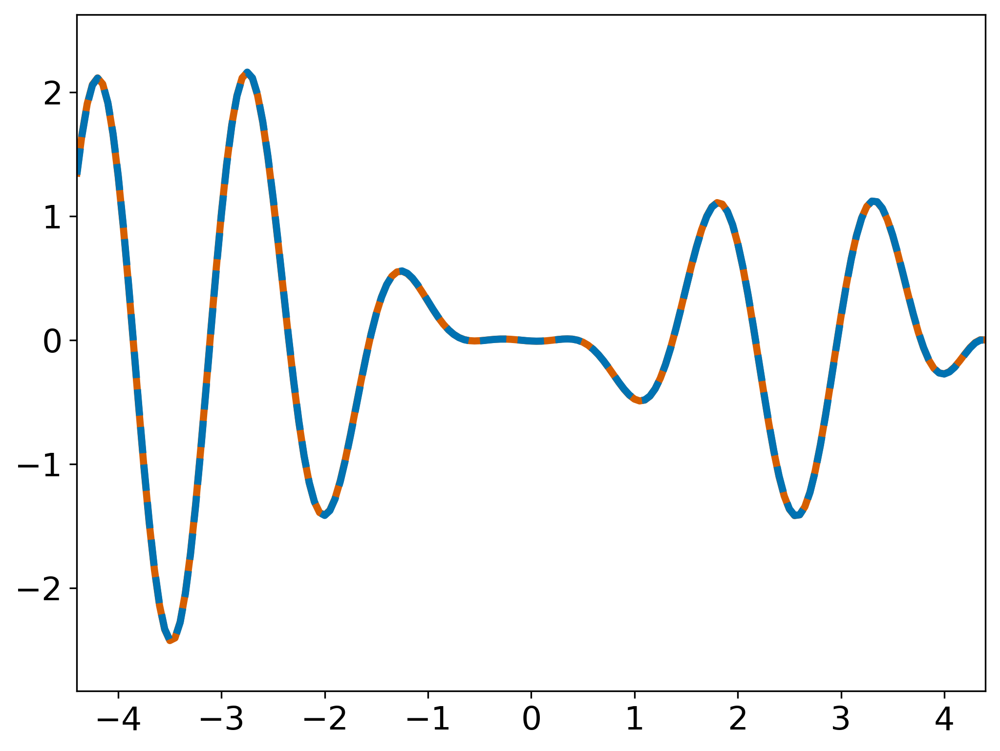

In [46]:
fields_keys = [_ for _ in f2a.keys()]
theory_field1 = f2a[fields_keys[1]].T[1]
theory_field2 = f2a[fields_keys[2]].T[1]

theory_field1_times = f2a[fields_keys[1]].T[0]
theory_field2_times = f2a[fields_keys[2]].T[0]

plt.figure()
plt.plot(theory_field1_times, theory_field1, color=ok['red'])
plt.plot(theory_field2_times, theory_field2, color=ok['navy'], linestyle='--')
plt.xlim(-4.4, 4.4)
plt.show()

In [47]:
print(theory_field1_times[0])

-55.0


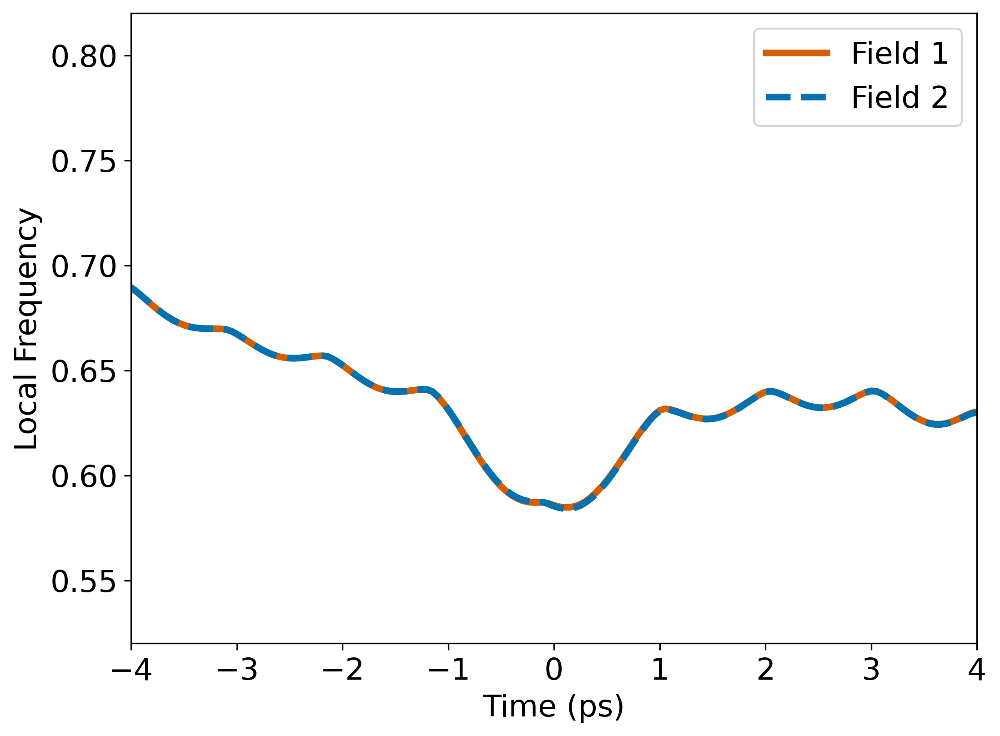

TypeError: float() argument must be a string or a real number, not 'Pulse'

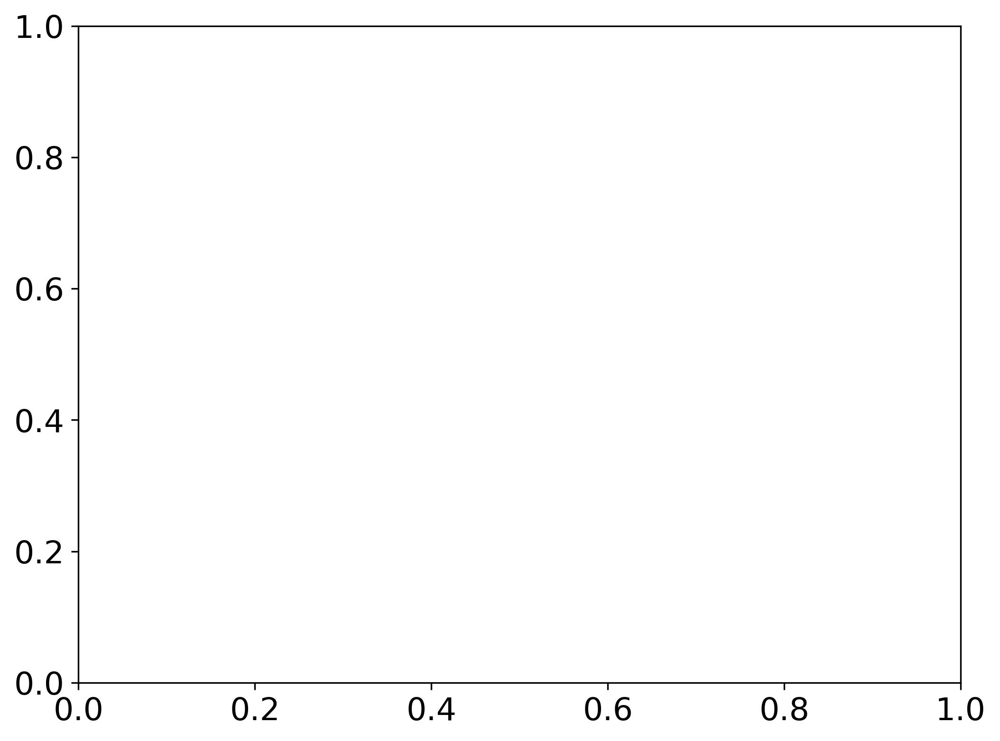

In [48]:
tf1_lf, tf1_lf_t = get_lf_stft(theory_field1, theory_field1_times, pad=3)
tf2_lf, tf2_lf_t = get_lf_stft(theory_field2, theory_field2_times, pad=3)

tf1_lf_t -= 55
tf2_lf_t -= 55

plt.plot(tf1_lf_t, tf1_lf, color=ok['red'], label='Field 1')
plt.plot(tf2_lf_t, tf2_lf, color=ok['navy'], label='Field 2', linestyle='--')
plt.xlim(-4, 4)
plt.ylim(0.52, 0.82)
plt.xlabel('Time (ps)')
plt.ylabel('Local Frequency')
plt.legend()
plt.savefig('./Plots/PRA_Paper/Theory_Fields_LF.png')
plt.show()

# For getting the local frequency using the old method
tf1_old = Pulse(time=theory_field1_times,
    field=theory_field1)
tf2_old = Pulse(time=theory_field1_times,
    field=theory_field1)

plt.plot(tf1_old)#, theory_field1_times)
plt.plot(tf2_old)#, theory_field1_times)
plt.show()

In [ ]:
h1 = [_ for _ in f1.keys()]

# The optimization data was sent already in log scale, so I needed to reset the scale and normalize to obtain beter axes
theory_SO_amp = 10 ** np.array(f1[h1[0]].T[1])

theory_08_amp = 10 ** np.array(f1[h1[1]].T[1])
theory_07_amp = 10 ** np.array(f1[h1[2]].T[1])
theory_06_amp = 10 ** np.array(f1[h1[3]].T[1])
theory_05_amp = 10 ** np.array(f1[h1[4]].T[1])

# The time values were created using an old treatment of the variable T_Obs, so the values are double what they are supposed to be
theory_SO_t = np.array(f1[h1[0]].T[0]) / 2
step = f1['SO'].T[0][-1] - f1['SO'].T[0][-2]
theory_08_t = np.array(f1[h1[1]].T[0]) / 2
theory_07_t = np.array(f1[h1[2]].T[0]) / 2
theory_06_t = np.array(f1[h1[3]].T[0]) / 2
theory_05_t = np.array(f1[h1[4]].T[0]) / 2


plt.figure()
plt.semilogy(theory_08_t, theory_08_amp, color=ok['blue'], label=h1[1], linestyle='-.')
plt.semilogy(theory_07_t, theory_07_amp, color=ok['orange'], label=h1[2])
plt.semilogy(theory_06_t, theory_06_amp, color=ok['green'], label=h1[3])
plt.semilogy(theory_05_t, theory_05_amp, color=ok['amber'], label=h1[4], linestyle='-.')

plt.semilogy(theory_SO_t, theory_SO_amp, color=ok['black'], label=h1[0], linestyle='--')

plt.axvline(0.6, color=ok['purple'], label='$T_{Obs} = T_{SO}$')
plt.xlim([theory_SO_t[-2], 4])
plt.xlabel('$T_{Obs}$ (ps)')
plt.ylabel('$J$')
plt.legend()
plt.tight_layout()
plt.savefig('./Plots/PRA_Paper/TheoryJ.pdf')
plt.show()


In [ ]:
center_times = []
theory_SO_window, theory_SO_5_window, theory_SO_6_window, theory_SO_7_window, theory_SO_8_window = ([] for _ in range(5))
theory_obs_width = int(np.ceil(1.2/np.abs(theory_field1_times[0]-theory_field1_times[1])))


for _ in range(len(theory_field1_times)-theory_obs_width):
    center_times.append(theory_field1_times[_+int(theory_obs_width * 0.5)])
    fixed_wedge = slice(_, (_ + theory_obs_width))
    theory_SO_window.append(get_j(theory_field1, theory_field2, theory_field1_times, fixed_wedge))
    #theory_SO_5_window.append(get_j(Glu_SO_5.field, LGA_SO_5.field, times, fixed_wedge))
    #theory_SO_6_window.append(get_j(Glu_SO_6.field, LGA_SO_6.field, times, fixed_wedge))
    #theory_SO_7_window.append(get_j(Glu_SO_7.field, LGA_SO_7.field, times, fixed_wedge))
    #theory_SO_8_window.append(get_j(Glu_SO_8.field, LGA_SO_8.field, times, fixed_wedge))
    
plt.semilogy(center_times, theory_SO_window, label='SO', color=ok['black'], linestyle='--')
plt.xlim(-4, 4)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
moving_window_keys= [_ for _ in f3.keys()]

# Like the previous data, this data was sent via .npz files so is not calculated here.
theory_08_window = 10 ** np.array(f3[moving_window_keys[1]].T[1])
theory_07_window = 10 ** np.array(f3[moving_window_keys[2]].T[1])
theory_06_window = 10 ** np.array(f3[moving_window_keys[3]].T[1])
theory_05_window = 10 ** np.array(f3[moving_window_keys[4]].T[1])

theory_SO_window = 10 ** np.array(f3[moving_window_keys[0]].T[1])

theory_08_window_t = np.array(f3[moving_window_keys[1]].T[0])
theory_07_window_t = np.array(f3[moving_window_keys[2]].T[0])
theory_06_window_t = np.array(f3[moving_window_keys[3]].T[0])
theory_05_window_t = np.array(f3[moving_window_keys[4]].T[0])

theory_SO_window_t = np.array(f3[moving_window_keys[0]].T[0])


plt.figure()
plt.semilogy(theory_08_window_t, theory_08_window, label=moving_window_keys[1], linestyle='-.')
plt.semilogy(theory_07_window_t, theory_07_window, label=moving_window_keys[2])
plt.semilogy(theory_06_window_t, theory_06_window, label=moving_window_keys[3])
plt.semilogy(theory_05_window_t, theory_05_window, label=moving_window_keys[4], linestyle='-.')

plt.semilogy(theory_SO_window_t, theory_SO_window, label=moving_window_keys[0], linestyle='--', color=ok['black'])
#plt.semilogy(center_times, theory_SO_window, label='My Calculated SO', color=ok['grey'], linestyle='--')

plt.xlim([-4, 4])
plt.ylim([3e-6, 3e-2])
plt.xlabel("$T_{Obs}$ (ps)")
plt.ylabel("$J$")
plt.legend()
plt.tight_layout()

plt.savefig('./Plots/PRA_Paper/J_window.pdf')
plt.show()